In [298]:
%autosave 60
import matplotlib.pyplot as plt
import numpy as np
from nexusformat.nexus import nxload
from pathlib import Path
import datetime


class Nexus_handling:
    def get_nexus_data_I06(self,file):
        """Function that loads the data from a nexus file and returns it as a list of numpy
arrays"""
        entry_string = "entry"
        data_region_list = []
        metadata_region_list = None
        x_array = file[entry_string]["instrument"]["fastEnergy"]["value"].nxvalue
        y_array = file[entry_string]["instrument"]["fesData"]["C1"].nxvalue
        data_region_list.append({"x": x_array, "y": y_array})
        y_array = file[entry_string]["instrument"]["fesData"]["C5"].nxvalue
        data_region_list.append({"x": x_array, "y": y_array})
        y_array = file[entry_string]["instrument"]["fesData"]["idio"].nxvalue
        data_region_list.append({"x": x_array, "y": y_array})
        y_array = file[entry_string]["instrument"]["fesData"]["ifiofb"].nxvalue
        data_region_list.append({"x": x_array, "y": y_array})
        magnet_field = file[entry_string]["instrument"]["scm"]["field_z"].nxvalue
        metadata_region_list = {"magnet_ﬁeld": magnet_field}
        polar = file[entry_string]["instrument"]["id"]["polarisation"].nxvalue
        metadata_region_list["polarisation"] = polar
        temp = file[entry_string]["instrument"]["scm"]["T_sample"].nxvalue
        metadata_region_list["T_sample"] = temp
        ###Add temperature values here
        ### Add angle of the beam here => 
        return data_region_list, metadata_region_list

    def open_single_spectra(self,ﬁle_number,directory_path,ﬁle_preﬁx,sensor):
        ﬁle_name = directory_path + ﬁle_preﬁx + str(ﬁle_number) + ".nxs"
        spectra_ﬁle = nxload(ﬁle_name)
        data,meta_data = self.get_nexus_data_I06(spectra_ﬁle)
        if sensor == "TEY":
            spectra = {"x" : data[2]["x"],"y":data[2]["y"],"meta" : meta_data}
        elif sensor == "TFY":
            spectra = {"x" : data[3]["x"],"y":data[3]["y"],"meta" : meta_data}
        return spectra

class XMCD_data_analysis(Nexus_handling):
    def __init__(self):
        self.on_oI_edge_points = [571, 576.9]
        self.directory_path = None
        self.ﬁle_preﬁx = None
        self.energy = None
        self.spectra = []
        self.hyst = []
        self.XMCD = []
        self.magz = []
        #self.temperature
   

    def set_directory_path(self, directory_path):
        self.directory_path = directory_path

    def set_ﬁle_preﬁx(self, ﬁle_preﬁx):
        self.ﬁle_preﬁx = ﬁle_preﬁx

    def load_spectra(self, directory_path, ﬁle_preﬁx, XMCD_spectra_Set,sensor = "TEY"):  
        self.directory_path = directory_path
        self.ﬁle_preﬁx = ﬁle_preﬁx

        if len(XMCD_spectra_Set) != 1:
            for ﬁle_number in XMCD_spectra_Set: 
                print(file_number)
                data_set = self.open_single_spectra(ﬁle_number, directory_path,  ﬁle_preﬁx,sensor)
                self.spectra.append(data_set)
                self.energy = self.spectra[0]["x"]
        else:
            print(XMCD_spectra_Set)
            data_set = self.open_single_spectra(XMCD_spectra_Set[0], directory_path,  ﬁle_preﬁx,sensor)
            self.spectra.append(data_set)
    
            self.energy = self.spectra[0]["x"]
#######################################################################################
    ### Plotting functions
    
    def plot_spectra(self,XAS_file_Set,i, bounds = None, normalisation = None):
        #Plots a single XAS spectra out of a set 
        #XAS_file_set : a set of XAS scan numbers
        #i : the indice of which scan you want to plot
        Energy,Idio = XMCD.spectra[i]["x"],XMCD.spectra[i]["y"]
        if bounds is not None:
            plt.xlim(bounds[0])
            plt.ylim(bounds[1])

        if normalisation is not None:
            value = np.mean(Idio[:normalisation])
            plotting_y = Idio - value
            plotting_y = plotting_y / np.max(plotting_y) 
        else:
            plotting_y = Idio


        plt.plot(Energy,plotting_y,label = XAS_file_Set[i])
        plt.title(("XAS ",sensor,XAS_file_set[i],self.spectra[i]["meta"]["polarisation"]))
        plt.legend()
        plt.xlabel("Energy(eV)")
        plt.ylabel("idio")   

    def Dichroism(self,XMCD_ﬁle_Set, normalisation = None, avg = "Before"):
        #Takes in a series of XAS spectra of opposing polarisations then averages all the nc and all the pc and subtracts them to give us the dichroism
        # XMCD_file_Set : list of XAS spectra, at a minimum we need one of each polarisation of light.
        fig = plt.figure(figsize=(12, 6))
        ax = fig.subplots(1,3, sharey=True)  # (nrows, ncols, index)
        
        nc_storage = np.zeros(len(self.energy))
        pc_storage = np.zeros(len(self.energy))
        
        B_Field = self.spectra[0]["meta"]["magnet_ﬁeld"]
        temp = self.spectra[0]["meta"]["T_sample"]
        fig.suptitle("Dichroism at " + str(np.round(B_Field,2)) +  f"T {round(temp,3)}K")
        print("B Field - ",B_Field)
        ax[0].set_title("pc")
        ax[1].set_title("nc")
        ax[2].set_title("XMCD")
        
        ax[1].set_xlabel("energy (eV")
        ax[0].set_ylabel("idio")
        
        n,m = 0,0
        max_point = 0

        
        for i in range(0,len(XMCD_file_Set)):
            Polarisation = self.spectra[i]["meta"]["polarisation"]
            F = self.spectra[i]["y"]

            if normalisation is not None:
                value = np.mean(F[:normalisation])
                F -= value

            
            f=np.polyfit(self.energy, F, 1)

            fit=np.polyval(f,self.energy)
            mx = np.max((F-fit)+0.1)
            if mx > max_point:
                max_point = mx
            if Polarisation == "nc":
                nc_storage += F
                n += 1
                ax[0].plot(self.energy,F, label = XMCD_file_Set[i] )
                ax[0].legend()

            elif Polarisation == "pc":
                pc_storage = pc_storage + F
                m = m + 1
                ax[1].plot(self.energy,F,label = XMCD_file_Set[i] )
                ax[1].legend()

        if avg == "Before":
            nc_storage = nc_storage/n
            pc_storage = pc_storage/m
            dichroism = abs(pc_storage) - abs(nc_storage)

            max_dichroism = np.max(dichroism)
            percentage = max_dichroism/max_point
            print(f"Max Di - {max_dichroism}, Max Signal - {max_point}")
        
        ax[2].plot(self.energy,dichroism,label = f"XMCD - {np.round(percentage,3)}%")
        ax[2].legend()

        for axs in ax:
            axs.axhline(y = 0, color = 'b', linestyle = 'dashed') 
            # axs.set_ylim(-0.05, 1)
        return self.energy,dichroism                    

def prelimenary_code(directory_path, ﬁle_preﬁx, XAS_ﬁle_set,sensor):
    XMCD = XMCD_data_analysis()
    XMCD.load_spectra(directory_path, ﬁle_preﬁx, XAS_ﬁle_set,sensor)
    return XMCD

def get_values(file):
    
    nexus = nxload(file)
    TEY_A=nexus.entry.instrument.hyst2.detector1_A.nxvalue 
    TEY_B=nexus.entry.instrument.hyst2.detector1_B.nxvalue 
    I_0_A = nexus.entry.instrument.hyst2.detector2_A.nxvalue 
    I_0_B = nexus.entry.instrument.hyst2.detector2_B.nxvalue 
    
    return [TEY_A, TEY_B, I_0_A, I_0_B]



def Hysteresis(files, offset=[0,0]):
    if len(files) != 4:
        print("Wrong number of files")
        return 0
    values = {}
    
    for file in files:
        data = get_values("FILES/HOPG1/Hysteresis/" + file)
        for i, datum in enumerate(data):
            values[f"{file} {i}"] = datum # 0 = TeyA, 1 = TEYB, 2 = I0A, 3 = I0B

    nexus = nxload("FILES/HOPG1/Hysteresis/" + files[0])
    B_field = nexus.entry.instrument.hyst2.value.nxvalue

    
    norm_dict = {}
    numerator_6_8 = (((values[f"{files[0]} 0"] / values[f"{files[0]} 2"]) - (values[f"{files[0]} 1"] / values[f"{files[0]} 3"])) - ((values[f"{files[2]} 0"] / values[f"{files[2]} 2"]) - (values[f"{files[2]} 1"] / values[f"{files[2]} 3"])))
    denominator_6_8 = 0.5* (((values[f"{files[0]} 0"] / values[f"{files[0]} 2"]) - (values[f"{files[0]} 1"] / values[f"{files[0]} 3"])) + ((values[f"{files[2]} 0"] / values[f"{files[2]} 2"]) - (values[f"{files[2]} 1"] / values[f"{files[2]} 3"])))
    plotting_1 = numerator_6_8/denominator_6_8

    numerator_7_9 = -(((values[f"{files[1]} 0"] / values[f"{files[1]} 2"]) - (values[f"{files[1]} 1"] / values[f"{files[1]} 3"])) - ((values[f"{files[3]} 0"] / values[f"{files[3]} 2"]) - (values[f"{files[3]} 1"] / values[f"{files[3]} 3"])))
    denominator_7_9 = 0.5* (((values[f"{files[1]} 0"] / values[f"{files[1]} 2"]) - (values[f"{files[1]} 1"] / values[f"{files[1]} 3"])) + ((values[f"{files[3]} 0"] / values[f"{files[3]} 2"]) - (values[f"{files[3]} 1"] / values[f"{files[3]} 3"])))
    plotting_2 = numerator_7_9/denominator_7_9

    plt.figure(1)
    plt.plot(B_field, numerator_6_8, "s-" ,label = "PC") # just (A - B) - (C-D)
    plt.plot(B_field, numerator_7_9,"d-" ,label = "nC")
    plt.axhline(y=0)
    plt.axvline(x=0)
    plt.legend()
    
    plt.figure(2)
    plt.plot(B_field, plotting_1+offset[0],"s-", label = "PC_norm") # (A - B) - (C-D) / (0.5*(A - B) + (C-D))
    plt.plot(B_field, plotting_2+offset[1],"d-", label = "nC_norm")
    plt.legend()
    plt.axhline(y=0)
    plt.axvline(x=0)

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx], idx

def method1(XMCD):
    XMCD,pc_Bfield, nc_Bfield,pc_Fenergy, temp, label = XMCD

    hyst_point = max(XMCD)-min(XMCD)
    Bfield = (pc_Bfield + nc_Bfield)/2
    
    return hyst_point, Bfield, temp

def method2(XMCD):
    XMCD,pc_Bfield, nc_Bfield,pc_Fenergy, temp, label = XMCD

    avg_bkgd = np.mean(XMCD[:10])
    nearest_point, idx = find_nearest(pc_Fenergy, 576.8)
    hyst_point = XMCD[i] - avg_bkgd
    Bfield = (pc_Bfield + nc_Bfield)/2
    
    return hyst_point, Bfield, temp

def method3(XMCD):
    XMCD,pc_Bfield, nc_Bfield,pc_Fenergy, temp, label = XMCD

    xxxx, idx_max = find_nearest(pc_Fenergy, 576.8)
    xxxx, idx_min = find_nearest(pc_Fenergy, 578)
    max_point = XMCD[idx_max]
    min_point = XMCD[idx_min]

    hyst_point = max_point - min_point
    Bfield = (pc_Bfield + nc_Bfield)/2
    
    return hyst_point, Bfield, temp
    
    

def manual_hyst(data_dir,Yield = "TEY",normalisation=None,bounds =None, plot_xmcd=True, Label = False):

    files = [f.name for f in data_dir.iterdir() if f.is_file()]
    files.sort()

    mid = int(len(files)/2)
    
    pc_files = files[:mid]
    nc_files = files[mid:]
    # print("PC: ", pc_files)
    # print("NC: ", nc_files)

    final_pc = []
    final_nc = []
    
    for i, file in enumerate(files):
        nexus = nxload(str(data_dir)+ "/" + file)
        B_field = nexus.entry.instrument.scm.field_z.nxvalue
        if Yield == "TEY":
            TEY=nexus.entry.instrument.fesData.C1.nxvalue 
        elif Yield == "TFY":
            TEY=nexus.entry.instrument.fesData.C5.nxvalue     
        I0=nexus.entry.instrument.fesData.C2.nxvalue
        Fenergy = nexus.entry.instrument.fastEnergy.value.nxvalue
        polar = nexus.entry.instrument.id.polarisation.nxvalue
        temp = nexus.entry.instrument.scm.T_sample

        norm_TEY = TEY/I0

        if normalisation is not None:
            value = np.mean(norm_TEY[:normalisation])
            TEY_final = norm_TEY - value
        else:
            TEY_final = norm_TEY

        data = [TEY_final, B_field, Fenergy,temp, file]
        
        if polar == "pc":
            final_pc.append(data)
            # print(data[3], i)
        elif polar == "nc":
            final_nc.append(data)
            # print("nc",data[3], i)

    
    XMCDs = []
    
    for i, data in enumerate(final_pc):
        pc_TEY, pc_Bfield, pc_Fenergy,pc_temp, pc_file = data
        nc_TEY,nc_Bfield,nc_Fenergy, nc_temp,nc_file = final_nc[i]
        XMCD =  pc_TEY - nc_TEY
        # print(pc_file, nc_file)
        height_pc = max(pc_TEY) - min(pc_TEY)
        height_nc = max(nc_TEY) - min(nc_TEY)
        XMCD_norm = XMCD /(0.5*(height_pc +height_nc))
        label = f"{pc_file} - {nc_file} @ {pc_Bfield}/{nc_Bfield} @ {temp}K"
        # print(label)
        temp =(pc_temp + nc_temp)*0.5
        
        XMCD_data = [XMCD_norm, pc_Bfield, nc_Bfield,  pc_Fenergy,temp, label]

        percentage = 100*(max(abs(XMCD_norm))/max((max(abs(nc_TEY)) ,max(abs(pc_TEY)))))
        
        XMCDs.append(XMCD_data)
        if plot_xmcd:
            plt.figure(i)
            
            fig, [axXAS, axXMCD] = plt.subplots(1,2, sharey=True)
            axXAS.plot(pc_Fenergy, pc_TEY)
            axXAS.plot(nc_Fenergy, nc_TEY)
            axXMCD.plot(pc_Fenergy, XMCD_norm)
            
            axXAS.axvline(x=576.8, alpha=0.25, color = "b",linestyle = 'dashed', label = "576.8")
            axXAS.axvline(x=578.0, alpha=0.25, color = "c",linestyle = 'dashed', label = "578.0")
            axXMCD.axvline(x=576.8, alpha=0.25, color = "b",linestyle = 'dashed', label = "576.8")
            axXMCD.axvline(x=578.0, alpha=0.25, color = "c",linestyle = 'dashed', label = "578.0")
            plt.title(label)
            
            plt.axhline(y = 0, color = 'b', linestyle = 'dashed', label=f"{ round(percentage,3) }% ")
            plt.legend()
    # print(len(XMCDs))
    plt.figure(33) 
    M1_hyst, M1_B = [], []
    M2_hyst, M2_B= [], []
    M3_hyst, M3_B = [], []
    temps = []
    for i, XMCD in enumerate(XMCDs):
        # hyst, B, temp = method1(XMCD)
        # M1_hyst.append(hyst)
        # M1_B.append(B)

        hyst, B, temp = method2(XMCD)
        # M2_hyst.append(hyst)
        # M2_B.append(B)
        
        hyst, B, temp = method3(XMCD)
        M3_hyst.append(hyst)
        M3_B.append(B)
        temps.append(temp)
        if Label:
            plt.text(B,hyst, f"{i} {60-i}")
        
    co = np.arange(0,len(XMCDs),1)
    # plt.figure(31)
    # plt.scatter(M1_B, M1_hyst, c=co,cmap='winter')
    # plt.figure(32)
    # plt.scatter(M2_B, M2_hyst, c=co,cmap='winter')
    
    plt.scatter(M3_B, M3_hyst,marker='o' ,c=co,cmap='inferno')
    # plt.plot(M3_B, M3_hyst,linestyle="-" ,c="r")
    if bounds is not None:
        plt.xlim(bounds[0])
        plt.ylim(bounds[1])
    
    plt.axhline(y=0)
    plt.axvline(x=0)

    plt.colorbar()
    middle = len(M3_B) / 2
    print(M3_B)
    o, i = find_nearest(M3_B, 0)
    print(i)
    remenance =  M3_hyst[i]
    return max(M3_hyst), remenance, remenance/max(M3_hyst)

# def fast_hyst(files):


    
    


print("Saved Code")
directory_path = r"FILES/"
ﬁle_preﬁx = "i06-1-"
in_bounds = [[-0.1,0.1],[-0.1,0.1]]


print("ALL GOOD HERE BOSS: ", datetime.datetime.now())


Autosaving every 60 seconds
Saved Code
ALL GOOD HERE BOSS:  2025-02-01 16:53:57.421404


[-0.40035, -0.20055, -0.1005, -0.01565, -0.01035, -0.00545, -0.0, 0.0053, 0.0103, 0.0154, 0.09985, 0.20015, 0.39965, 0.4005, 0.20045000000000002, 0.1006, 0.01555, 0.01035, 0.0054, 0.0, -0.0053, -0.0103, -0.015349999999999999, -0.1001, -0.20015, -0.4002]
6


(np.float64(0.9144797526645057),
 np.float64(-0.3205257778619706),
 np.float64(-0.35050068295996667))

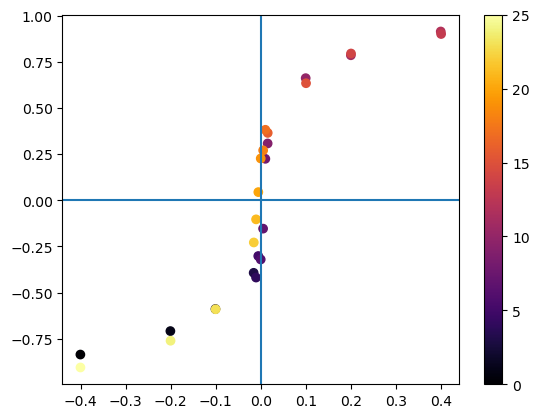

In [304]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_4/")
manual_hyst(file_path, normalisation=None, plot_xmcd=False, bounds=None)

347046
347047
347048
347049
347050
347051
347052


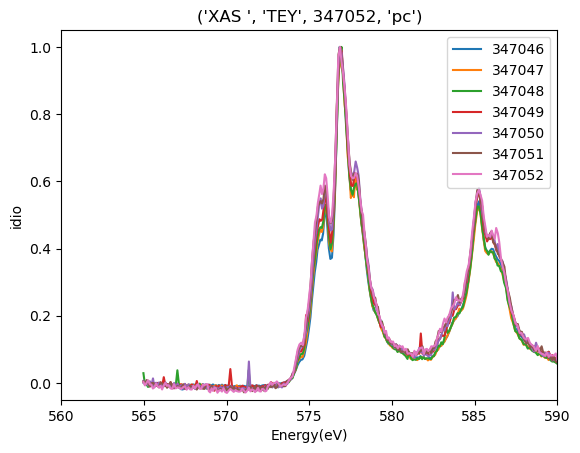

In [3]:
sensor = "TEY"
#sensor = "TFY"damage
directory_path = r"FILES/HOPG1/Checking for beam damage/"
XAS_ﬁle_set=[347046,347047,347048,347049,347050,347051,347052] #

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XAS_ﬁle_set,sensor)

####This line plots all the spectra in the given list.
for i in range(0,len(XAS_file_set)):
    XMCD.plot_spectra(XAS_file_set, i, bounds = [[560,590],[-0.05,1.05]], normalisation = 5)

347258
347257
B Field -  0.4005
Max Di - 0.7474092026801038, Max Signal - 1.22175097016475


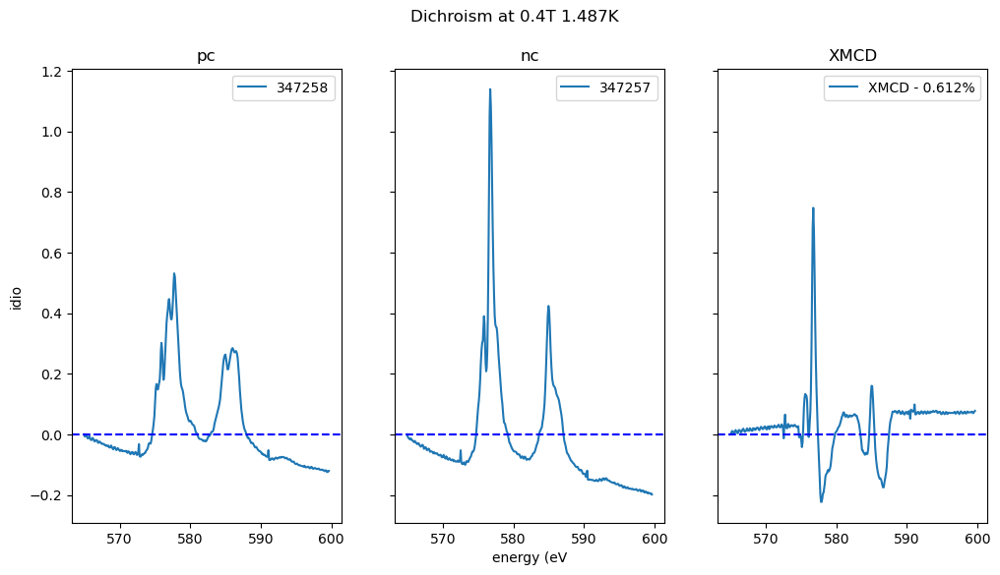

In [4]:
##60deg - 400mT Coercive Field 
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347258,347257)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=1)


In [5]:
files = ['i06-1-347283.nxs', 'i06-1-347285.nxs', 'i06-1-347286.nxs', 'i06-1-347284.nxs']

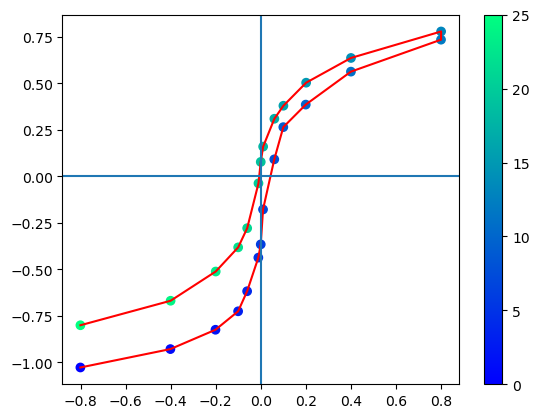

In [6]:
file_path = Path("FILES/HOPG1/Manual_Hysteresis_2/")
manual_hyst(file_path, Yield = "TEY", plot_xmcd = False,normalisation=None)

In [301]:
file_path = Path("FILES/HOPG1/Manual_Hysteresis_3/")
manual_hyst(file_path, Yield = "TEY", normalisation=None, Label = False, plot_xmcd =False,bounds = [-0.6,-0.75])

FileNotFoundError: [Errno 2] No such file or directory: 'FILES/HOPG1/Manual_Hysteresis_3'

[0.4004, 0.20124999999999998, 0.10055, 0.015600000000000001, 0.01035, 0.0054, 0.0, -0.0053, -0.0103, -0.0154, -0.10005, -0.20035, -0.39965, -0.4005, -0.2006, -0.10055, -0.015600000000000001, -0.0103, -0.0054, -0.0, 0.005350000000000001, 0.0103, 0.0154, 0.1001, 0.20029999999999998, 0.4004]
6


/tmp/ipykernel_54053/306186483.py:334: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, [axXAS, axXMCD] = plt.subplots(1,2, sharey=True)


(np.float64(0.9541082391672528),
 np.float64(0.2538756453249039),
 np.float64(0.26608683889627344))

<Figure size 640x480 with 0 Axes>

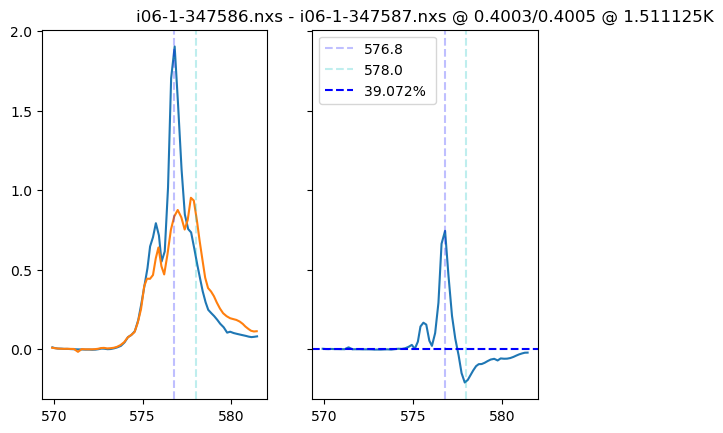

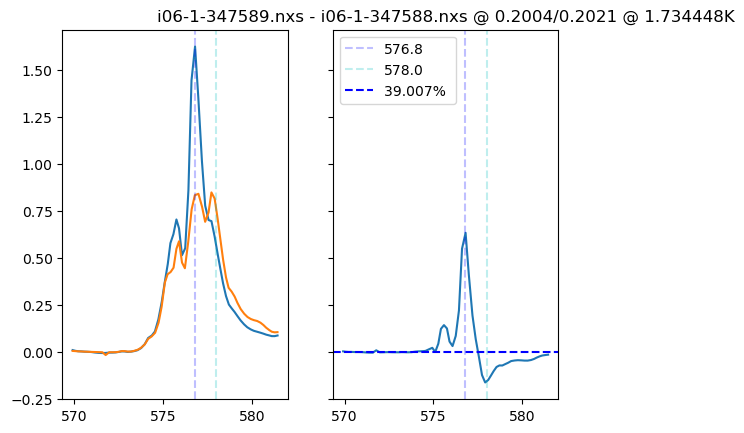

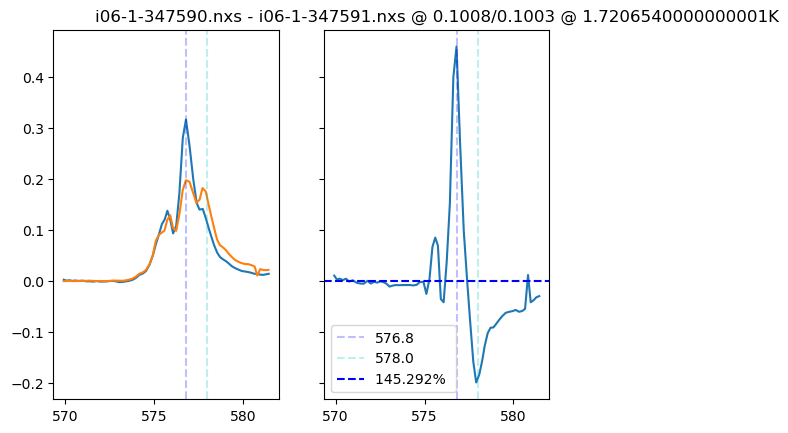

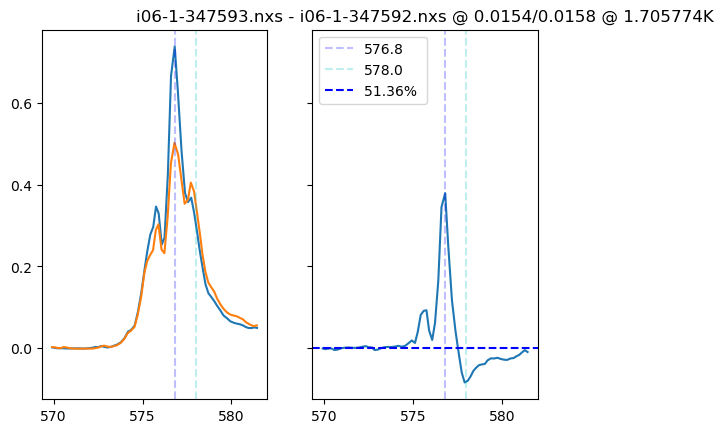

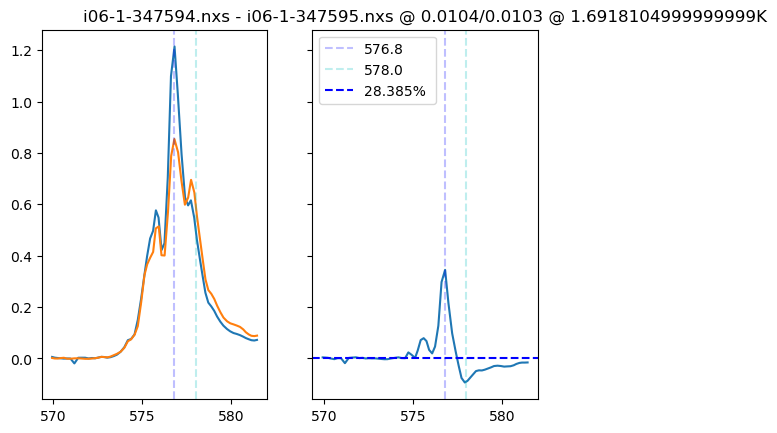

...

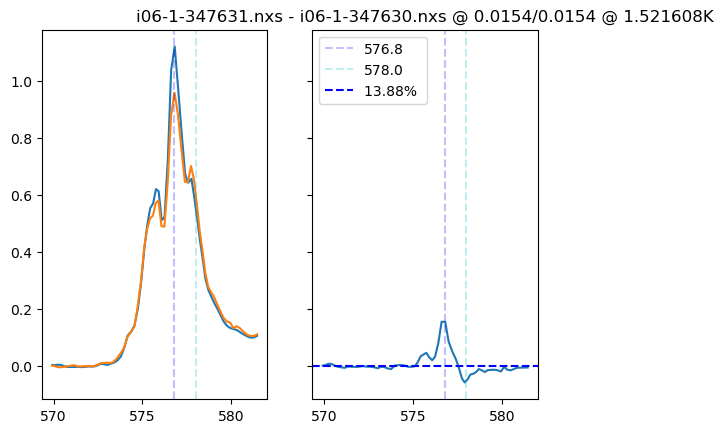

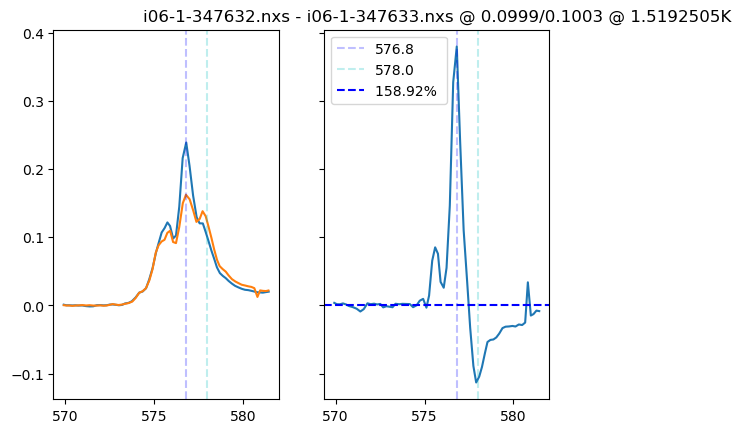

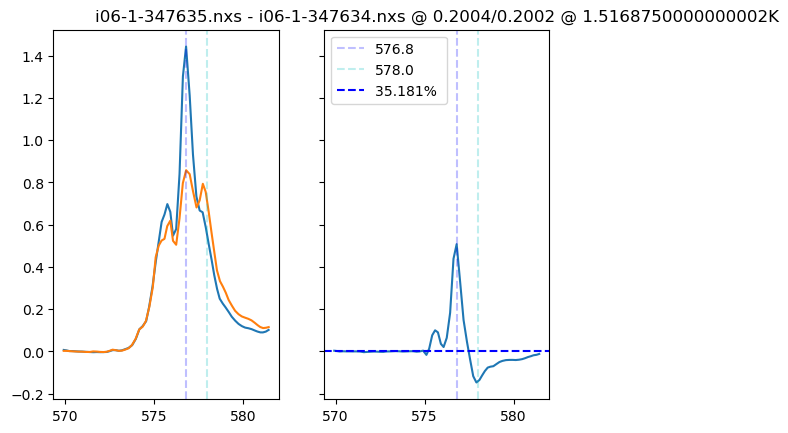

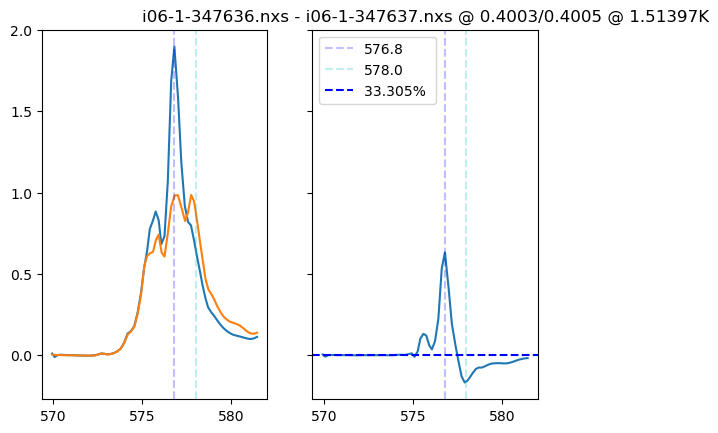

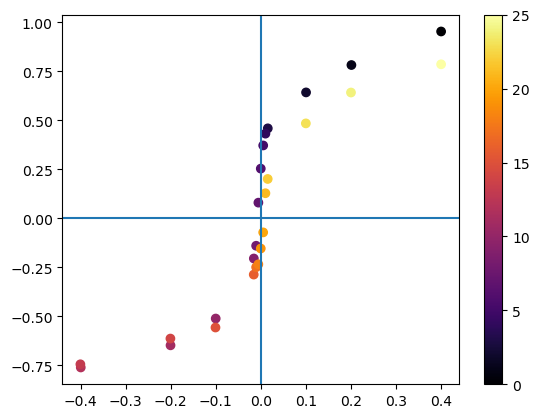

In [302]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_5/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =True)

/tmp/ipykernel_54053/306186483.py:334: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, [axXAS, axXMCD] = plt.subplots(1,2, sharey=True)


[-0.40035, -0.20055, -0.1005, -0.01565, -0.01035, -0.00545, -0.0, 0.0053, 0.0103, 0.0154, 0.09985, 0.20015, 0.39965, 0.4005, 0.20045000000000002, 0.1006, 0.01555, 0.01035, 0.0054, 0.0, -0.0053, -0.0103, -0.015349999999999999, -0.1001, -0.20015, -0.4002]
6


<Figure size 640x480 with 0 Axes>

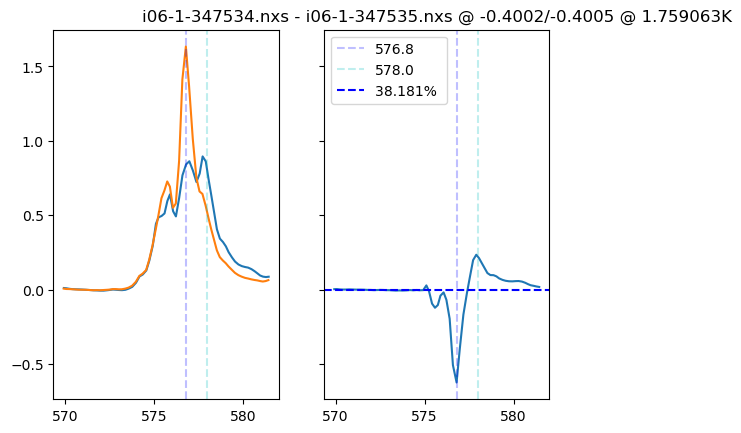

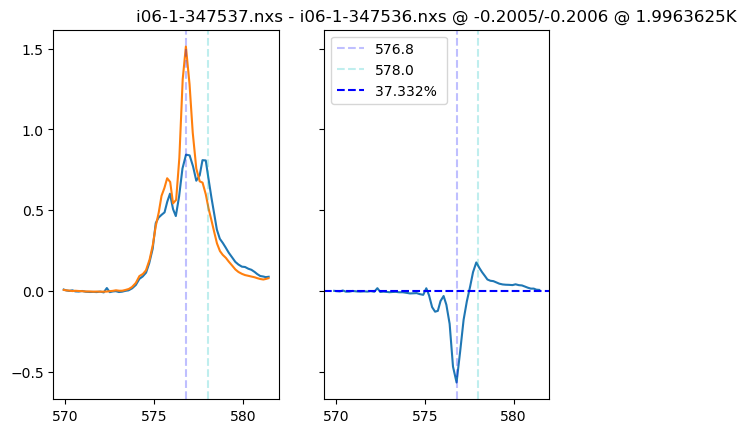

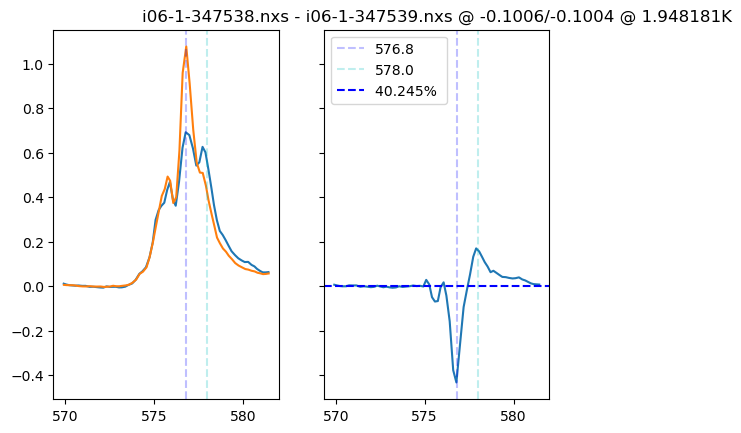

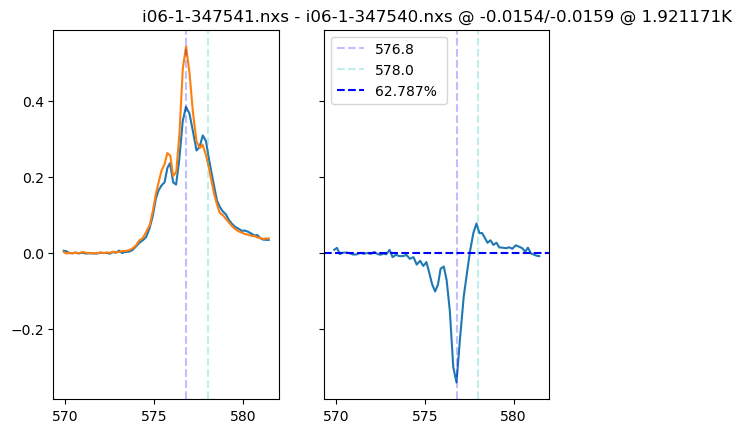

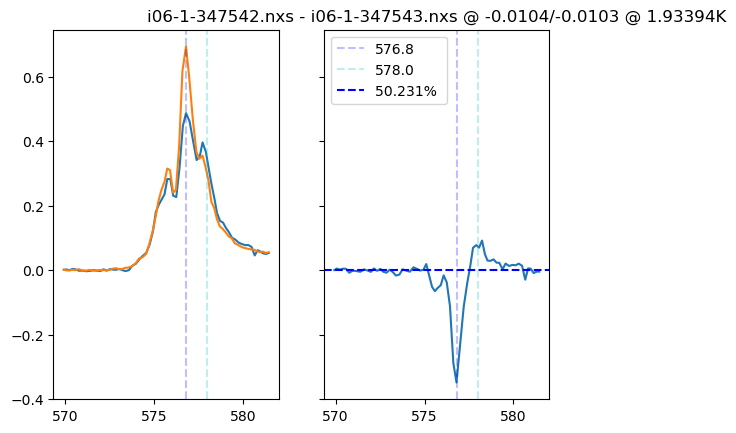

...

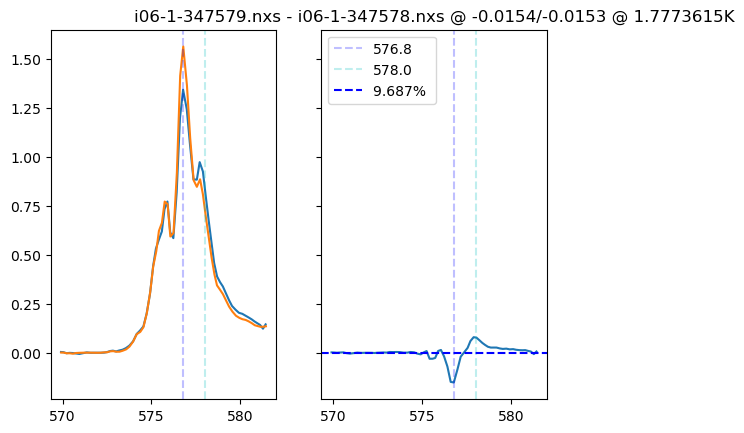

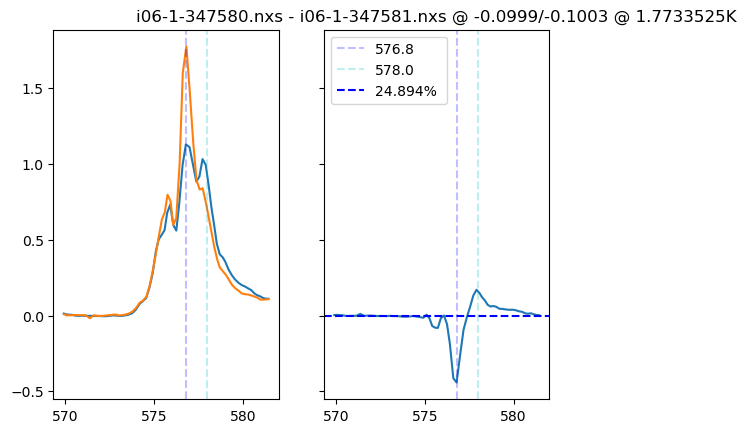

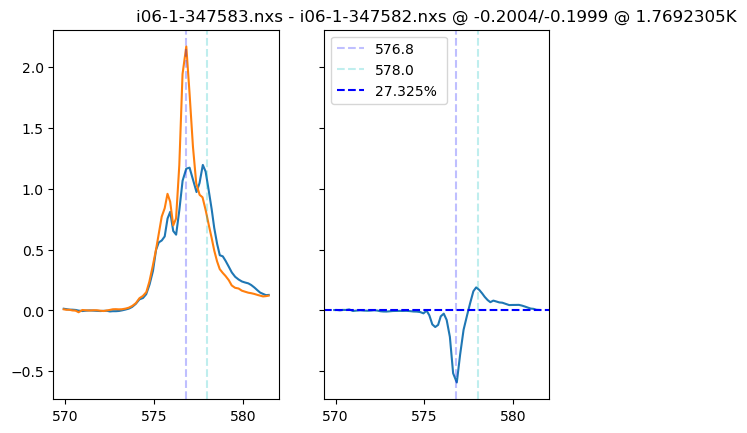

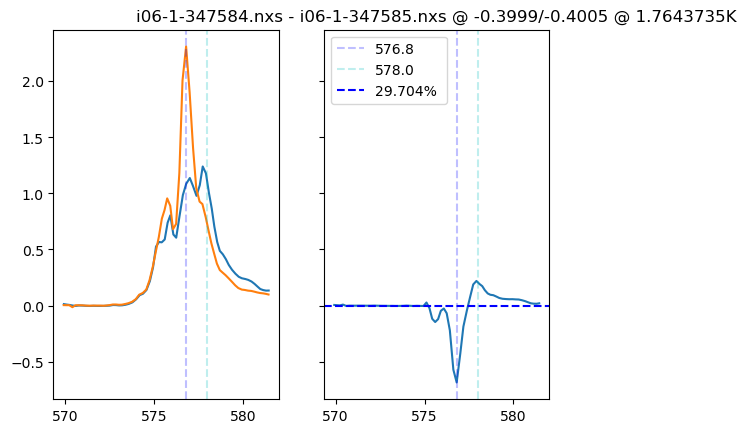

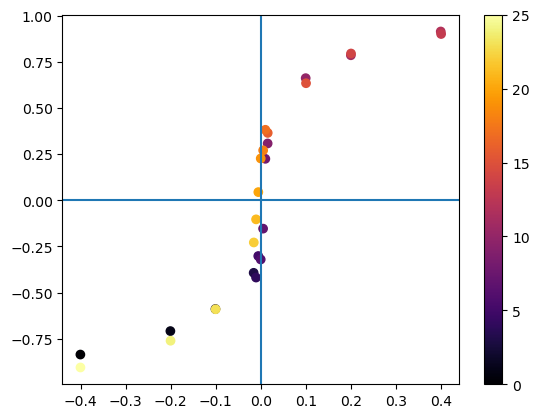

In [303]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_4/")
curve1 =  manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =True) #bounds = [(-0.1,0.1),(-0.5,0.5)

347638
347639
B Field -  2.0015
Max Di - 0.3590645961309722, Max Signal - 1.2745373017061765


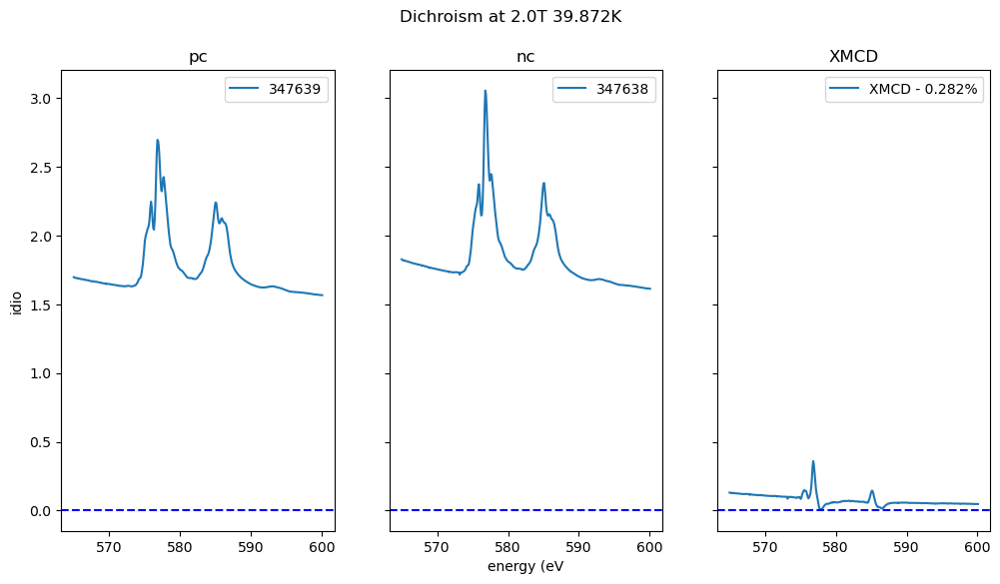

In [10]:
##60deg - 
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347638,347639)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=None) 


347640
347641
B Field -  2.0015
Max Di - 1.054049403297955, Max Signal - 1.4873159401455922


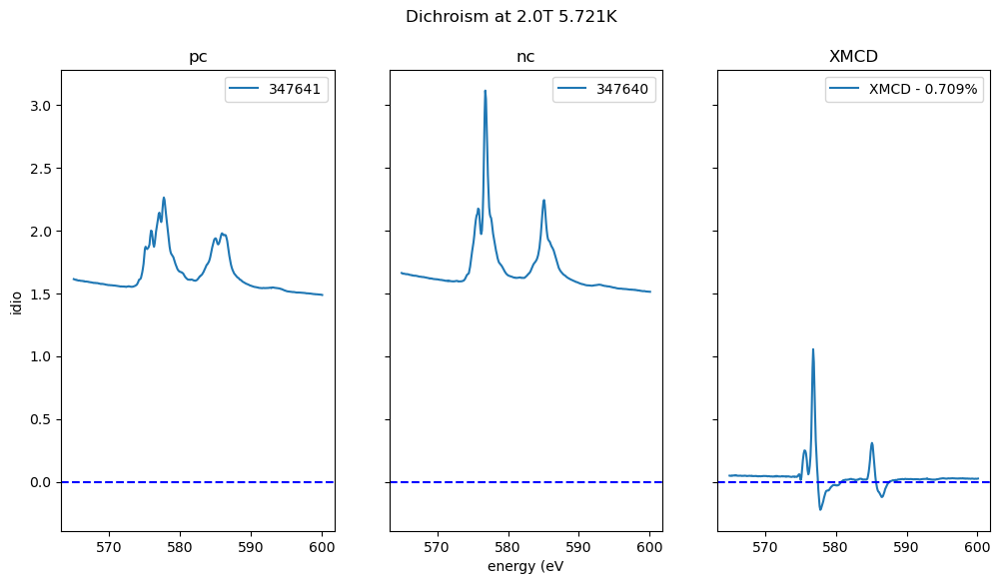

In [11]:
##60deg - 400mT Coercive Field 5.7k
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347640,347641)


XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=None) 


347642
347643
B Field -  2.0016
Max Di - 0.8541203809455291, Max Signal - 1.2905646533321482


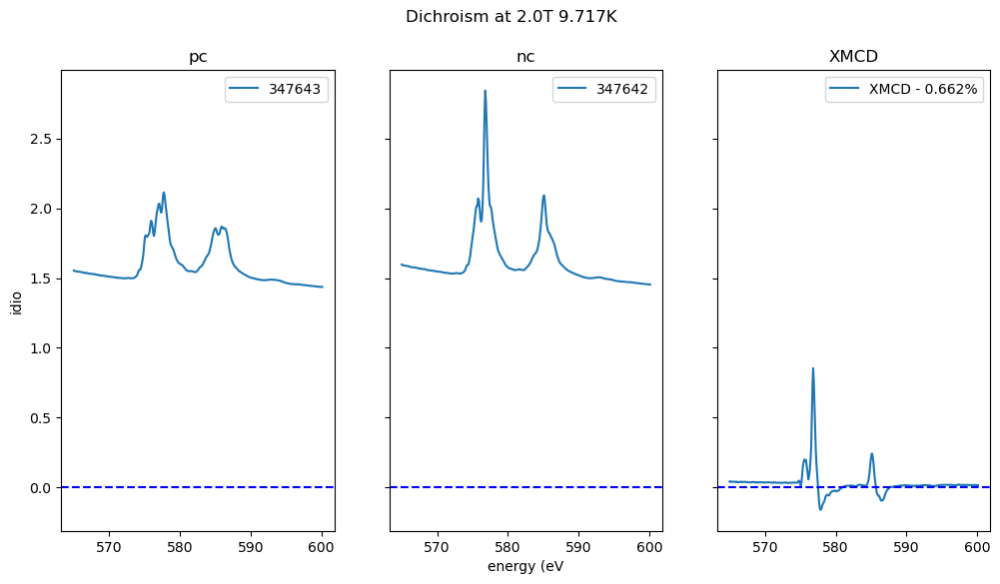

In [12]:
##60deg - 400mT Coercive Field 9.6k
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347642,347643)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=None) 


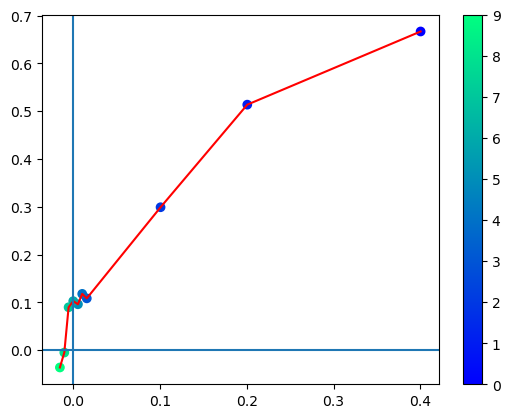

In [13]:
file_path = Path("FILES/HOPG1/Manual_Hysteresis_10k/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =False)

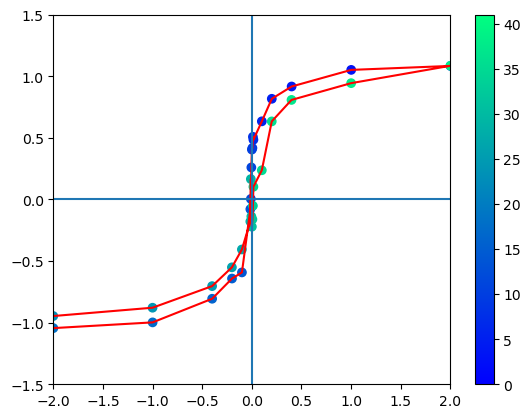

In [14]:
file_path = Path("FILES/HOPG1/Manual_Hysteresis_6/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =False,bounds = [(-2,2),(-1.5,1.5)])

In [194]:
file_path = Path("FILES/HOPG1/Manual_Hysteresis_7/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =False,bounds = None)

FileNotFoundError: [Errno 2] No such file or directory: 'FILES/HOPG1/Manual_Hysteresis_7'

347828
347829
B Field -  2.0015
Max Di - 0.8236231280607598, Max Signal - 1.6410656348884658


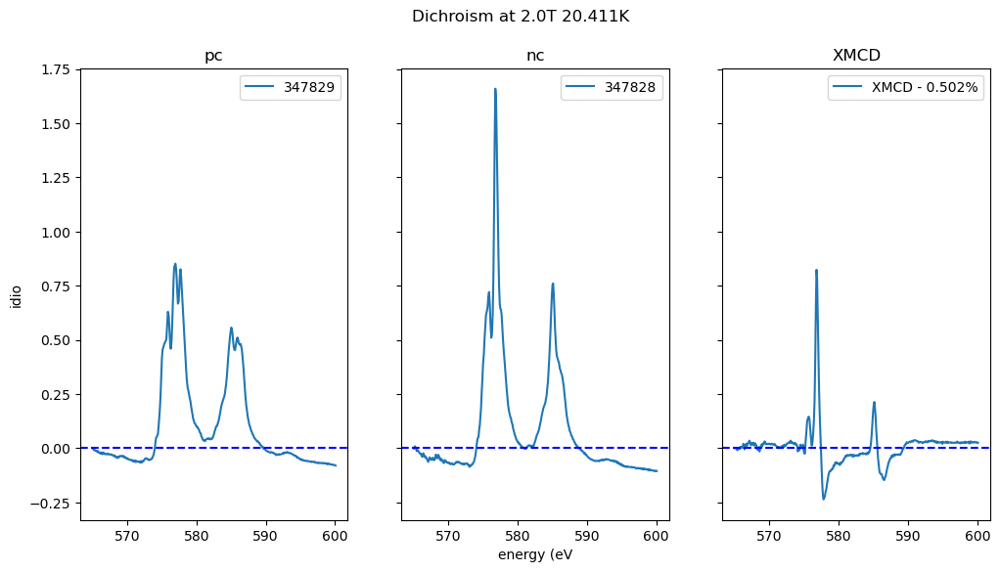

In [16]:
# We have temperature dependence using the PID loop XMCD NI at 20K
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347828,347829)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=1) 


347830
347831
B Field -  0.0
Max Di - 0.023499479713827265, Max Signal - 0.6026189139362366


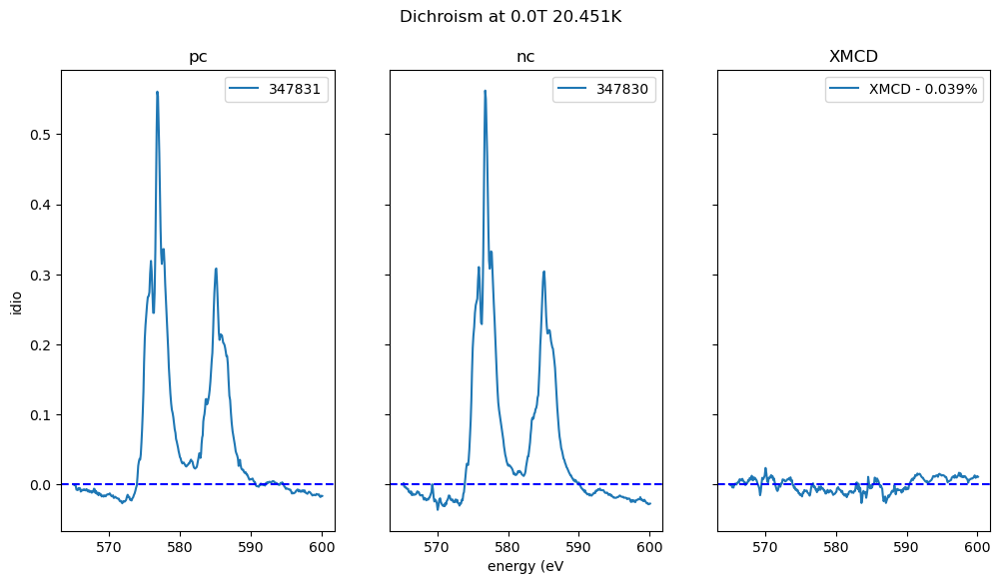

In [17]:
#### Checking for remnants at 20K 0 field NI

sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347830,347831)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=1) 


347832
347833
B Field -  -2.0015
Max Di - 0.30622566287834485, Max Signal - 1.6961462404253171


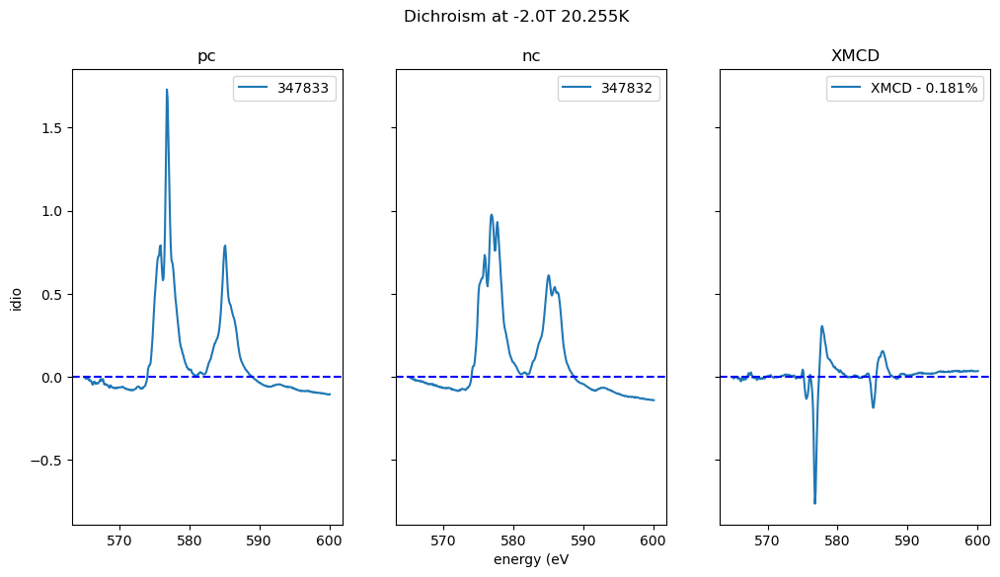

In [18]:
#-2T
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347832,347833)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=1) 


347834
347835
B Field -  -0.0
Max Di - 0.023682521537709444, Max Signal - 0.6734691561708687


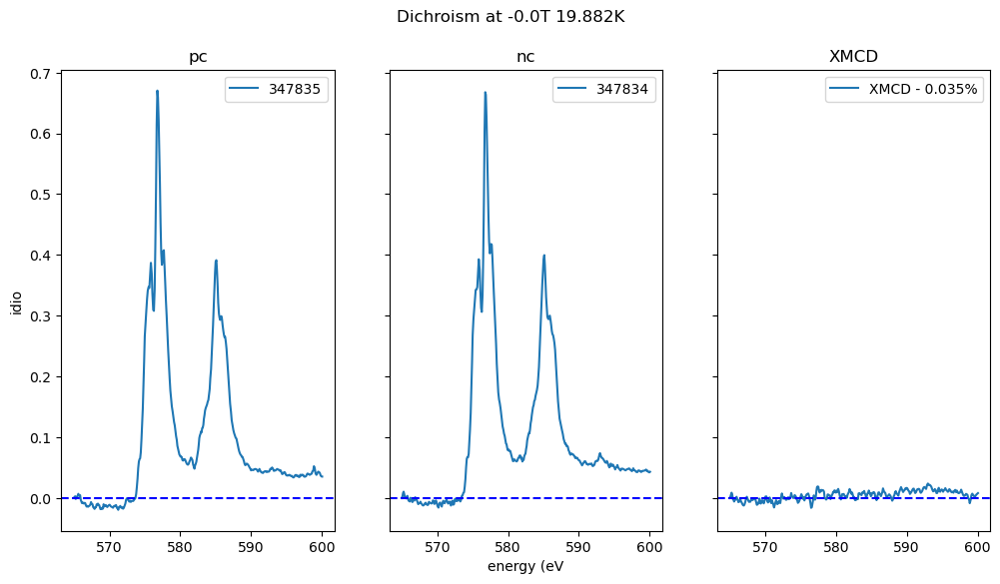

In [19]:
#0T from -2T

sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347834,347835)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=1) 


347838
347839
B Field -  2.0015
Max Di - 0.9949266913208696, Max Signal - 1.892502242706591


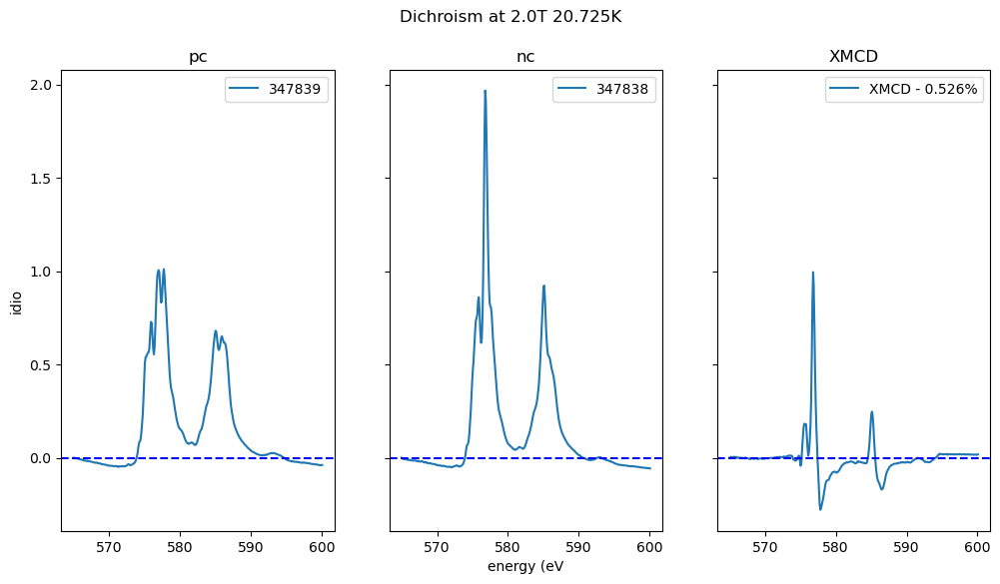

In [20]:
# Back at grazing (60) deg
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347838,347839)

XMCD = prelimenary_code13-15(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=1) 


347840
347841
B Field -  0.0
Max Di - 0.034747358536974415, Max Signal - 1.3164417976804792


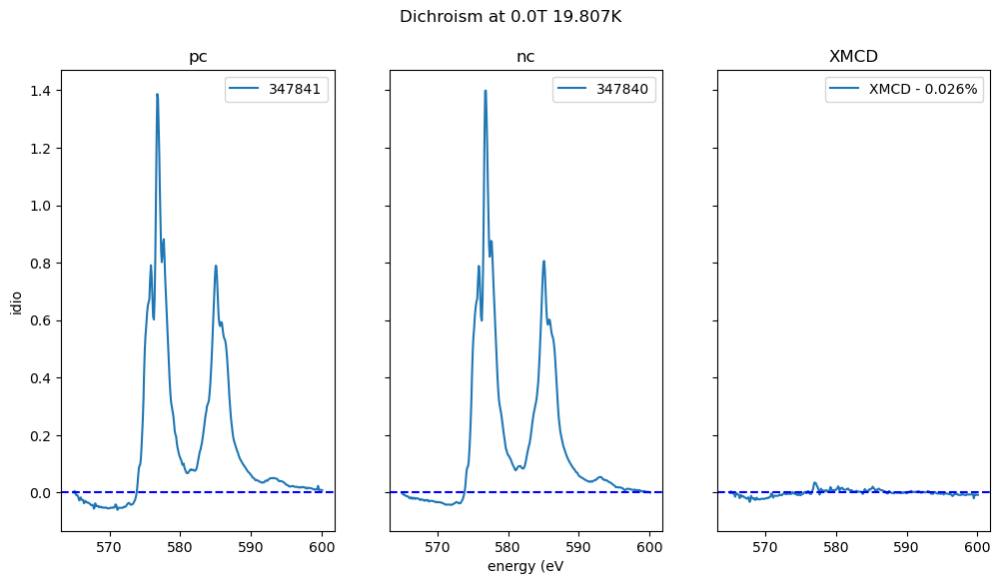

In [21]:
# Back at grazing 20K after a 2T field has been applied
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347840,347841)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=1) 


347842
347843
B Field -  -2.0015
Max Di - 0.3190258057846629, Max Signal - 2.0135181103641515


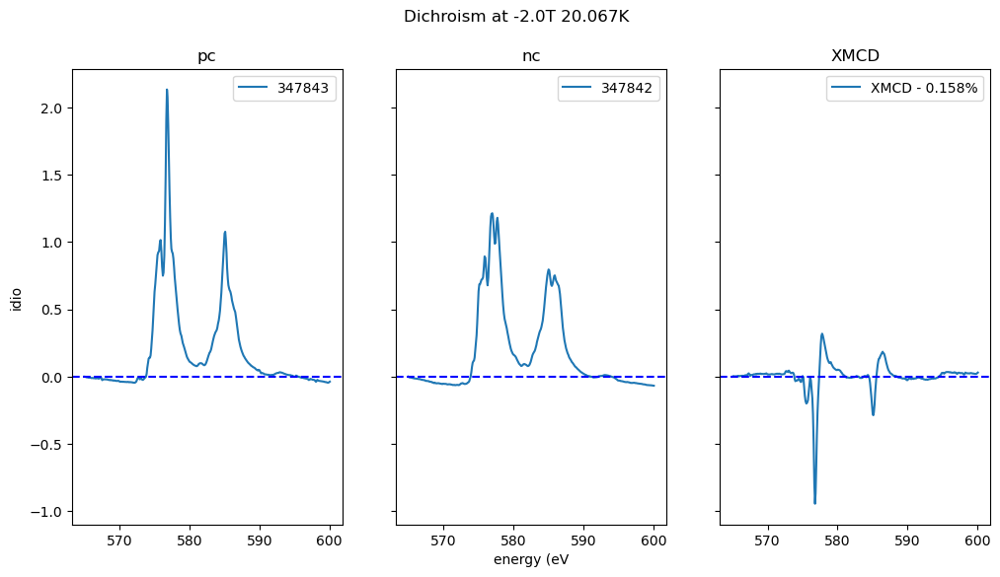

In [22]:
# Back at grazing
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347842,347843)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=1) 


347844
347845
B Field -  -0.0
Max Di - 0.0281795416911077, Max Signal - 1.5462140973319958


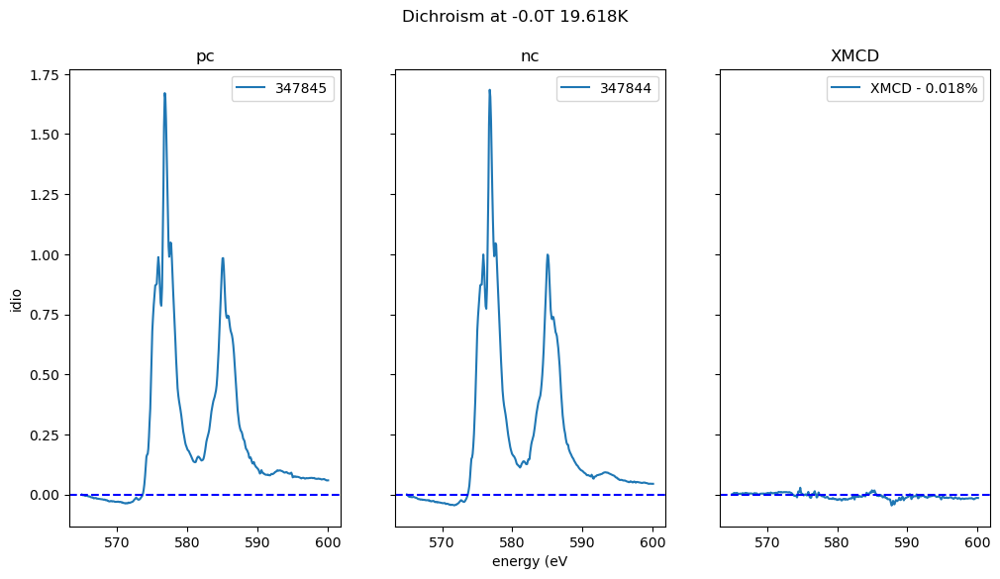

In [24]:
# Back at grazing
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347844,347845)
XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=1) 


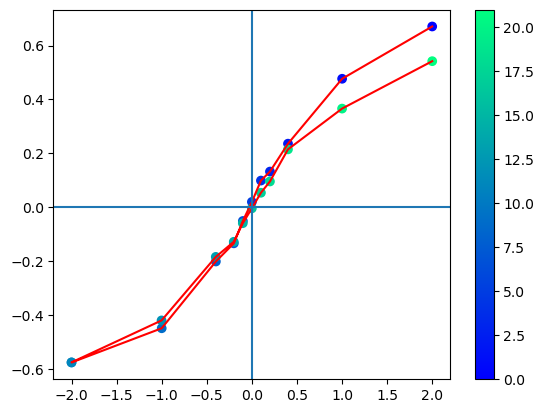

In [25]:
file_path = Path("FILES/HOPG1/Manual_Hysteresis_20k/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =False,bounds = None)

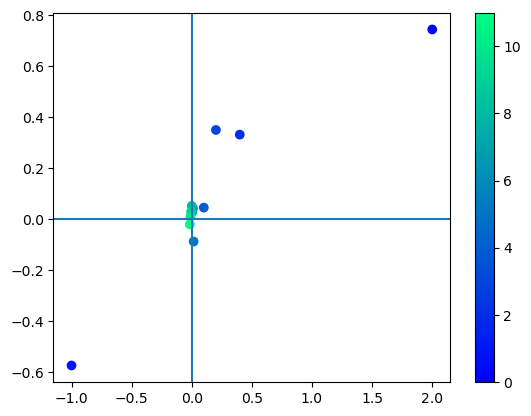

In [47]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_14k/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =False,bounds = None) #[[-1,1],[-0.8,0.8]]

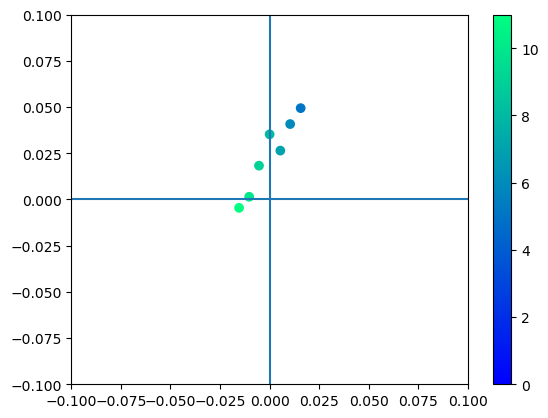

In [156]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_14k_2/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =False,bounds = [[-0.1,0.1],[-0.1,0.1]]) #[[-1,1],[-0.8,0.8]]

/tmp/ipykernel_54053/1678296557.py:334: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, [axXAS, axXMCD] = plt.subplots(1,2, sharey=True)


<Figure size 640x480 with 0 Axes>

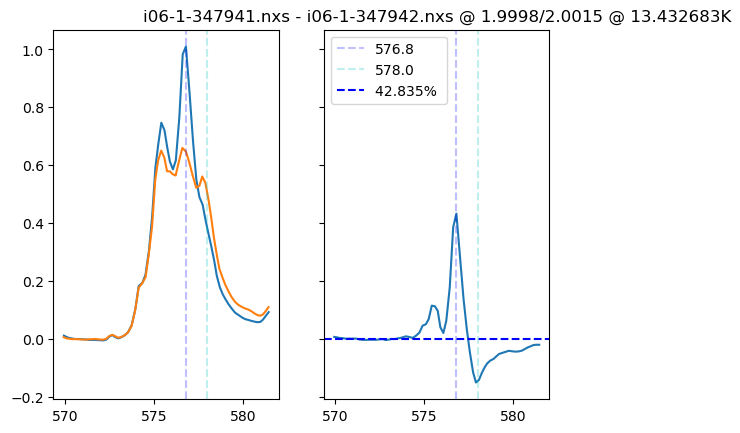

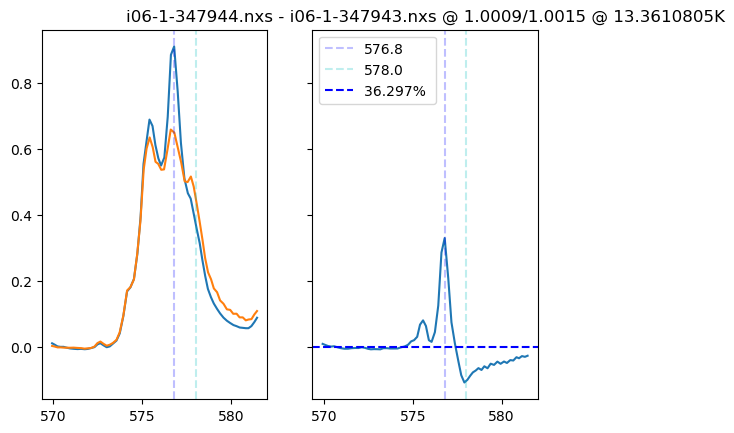

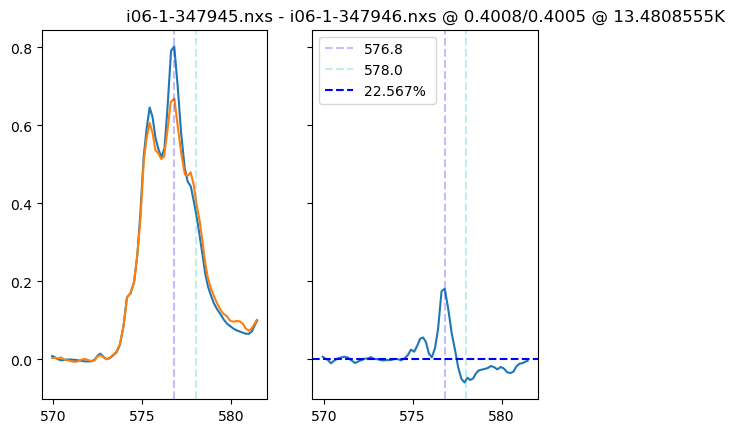

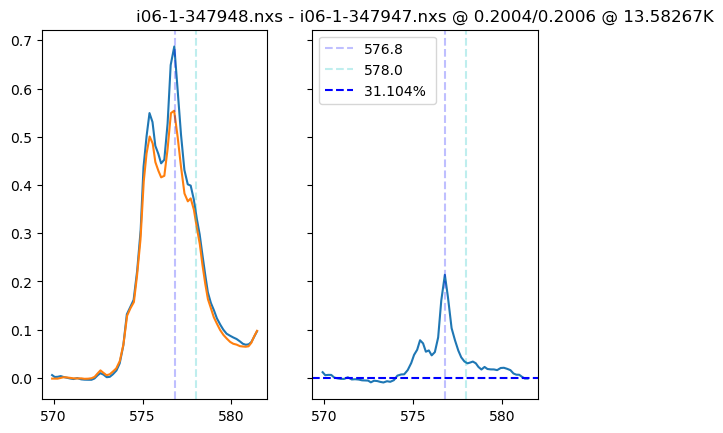

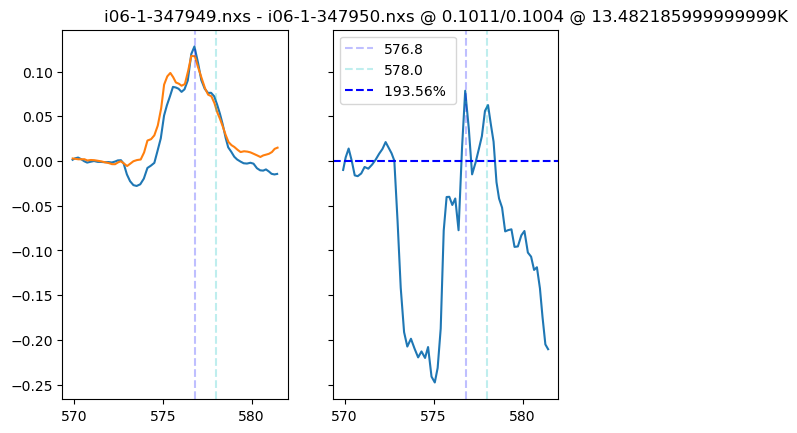

...

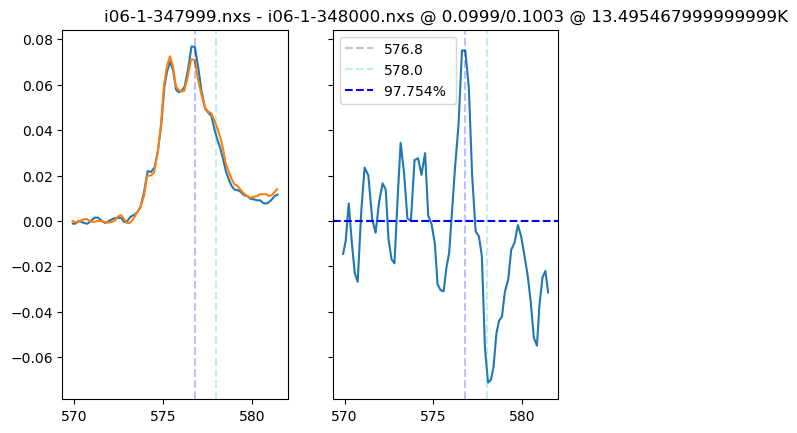

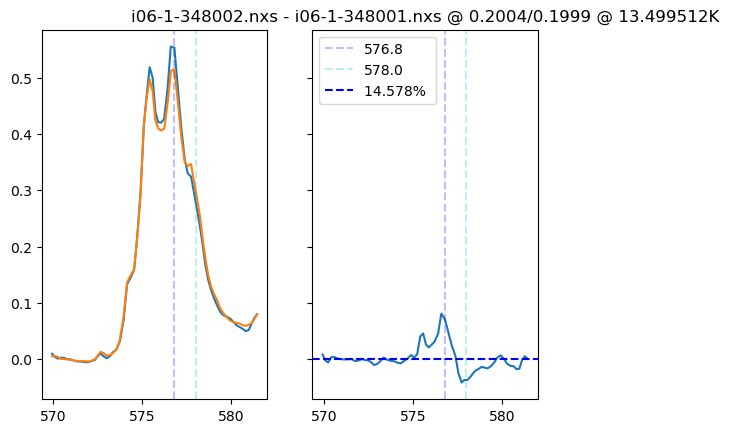

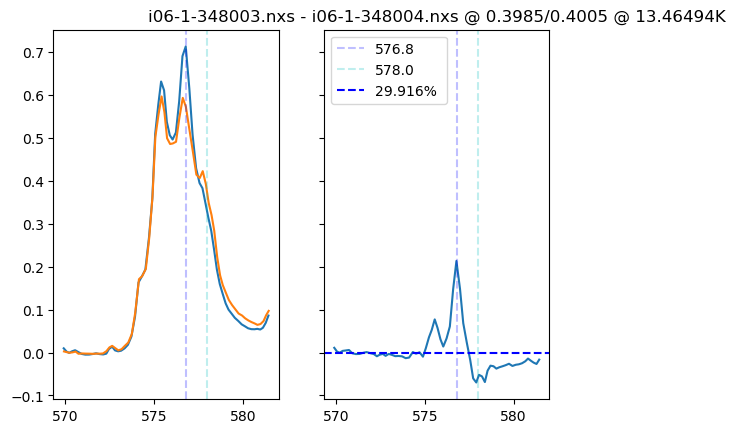

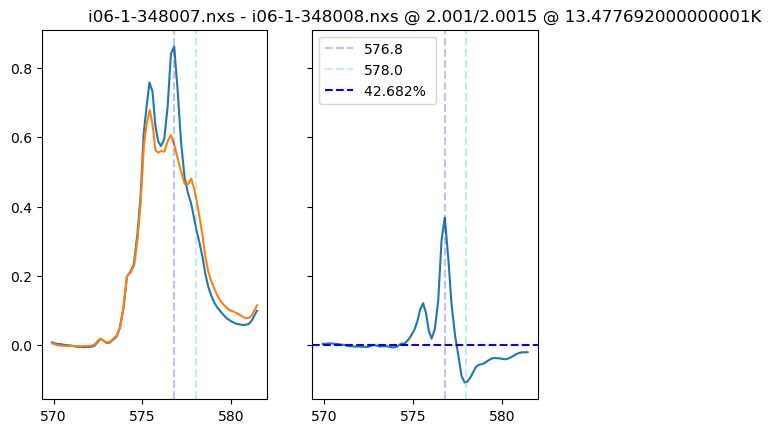

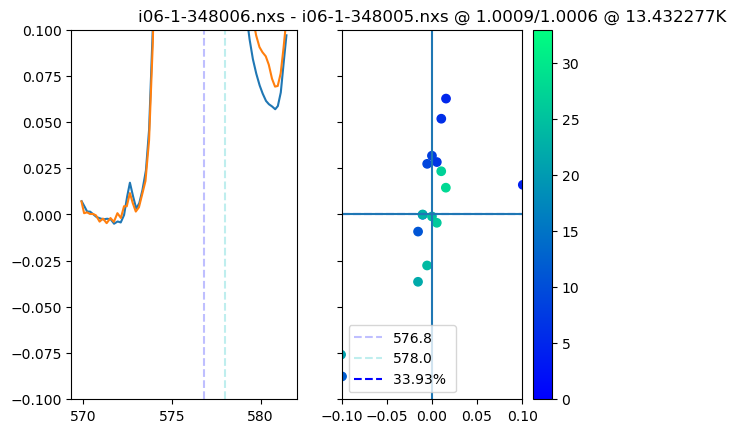

In [183]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_13.5k/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd = True, bounds = [[-0.1,0.1],[-0.1,0.1]]) #[[-1,1],[-0.4,0.4]]Skip to main panel


/tmp/ipykernel_54053/1678296557.py:334: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, [axXAS, axXMCD] = plt.subplots(1,2, sharey=True)


<Figure size 640x480 with 0 Axes>

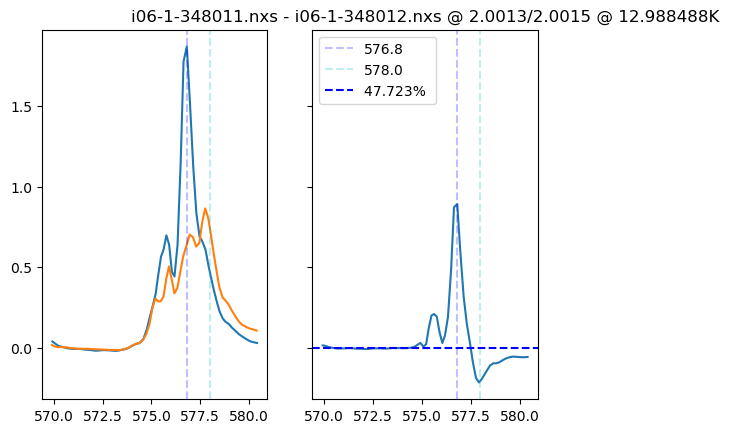

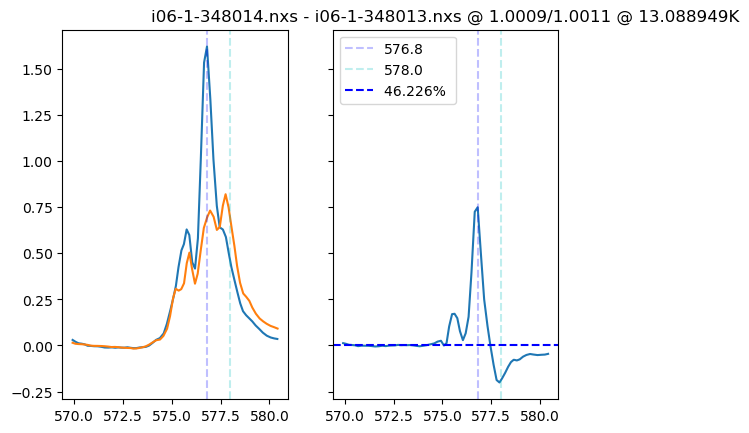

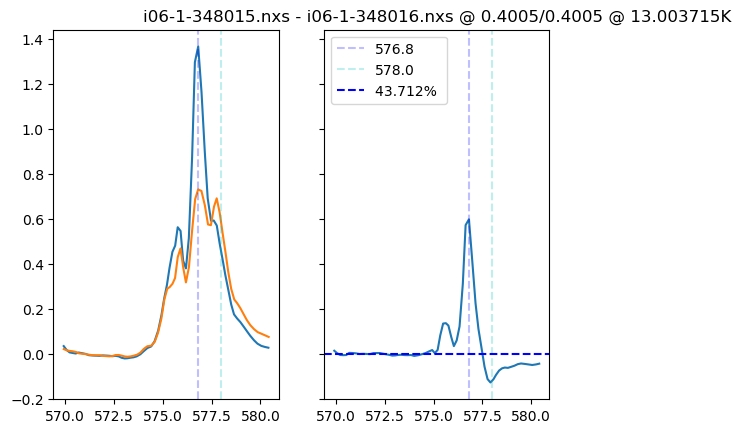

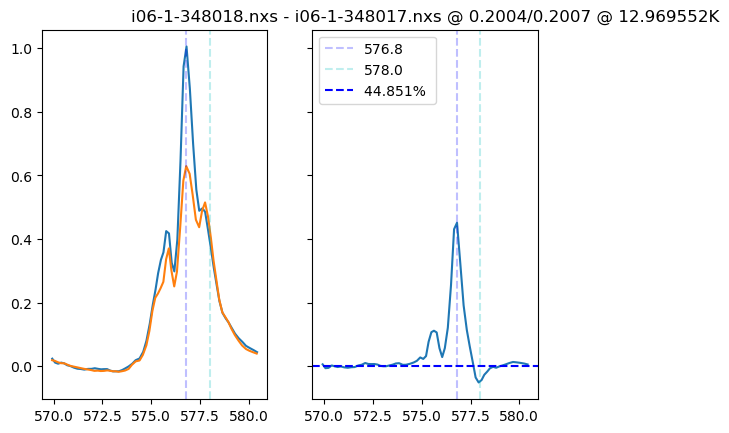

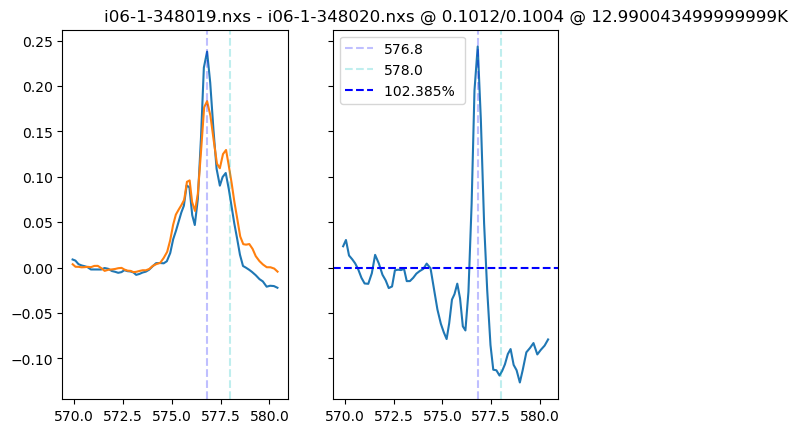

...

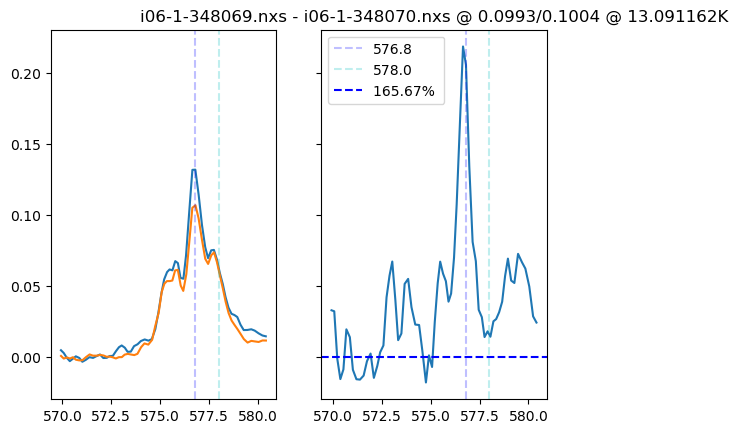

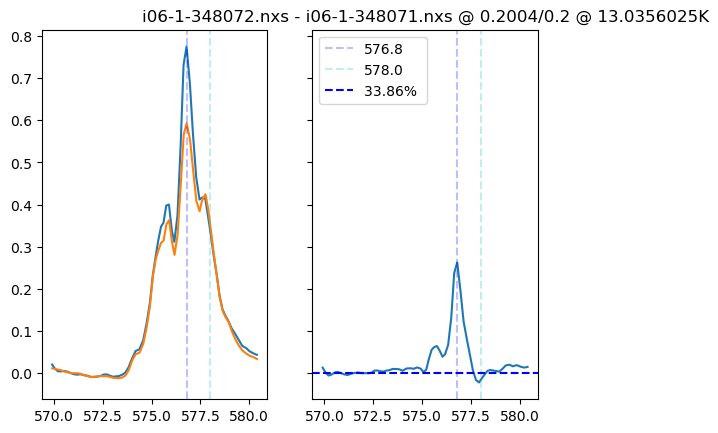

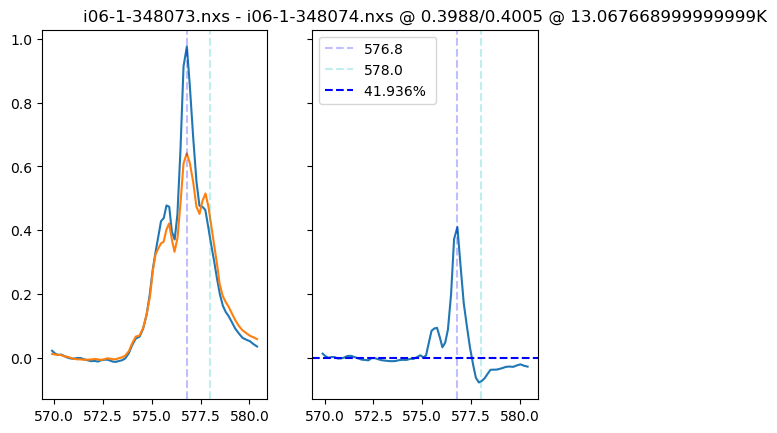

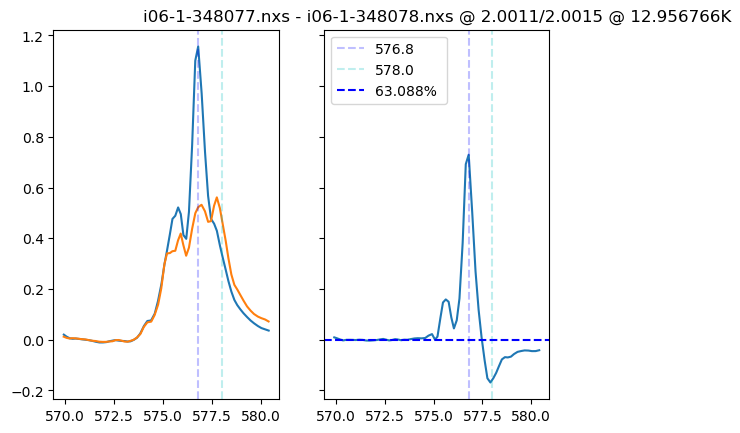

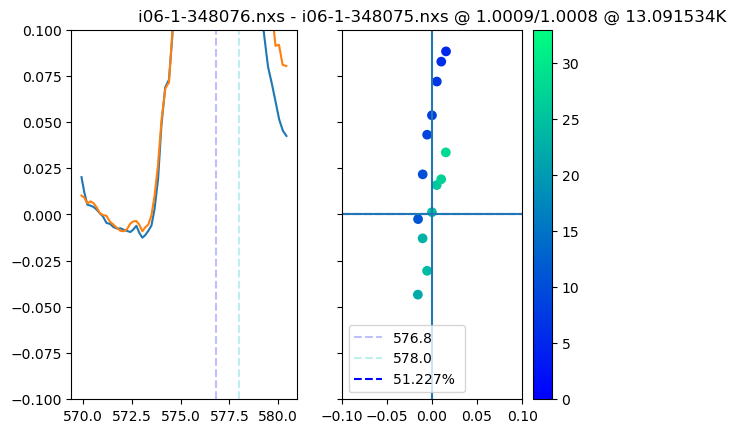

In [184]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_13k")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =True,bounds = in_bounds) #[[-1,1],[-0.8,0.8]]

/tmp/ipykernel_54053/1678296557.py:334: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, [axXAS, axXMCD] = plt.subplots(1,2, sharey=True)


<Figure size 640x480 with 0 Axes>

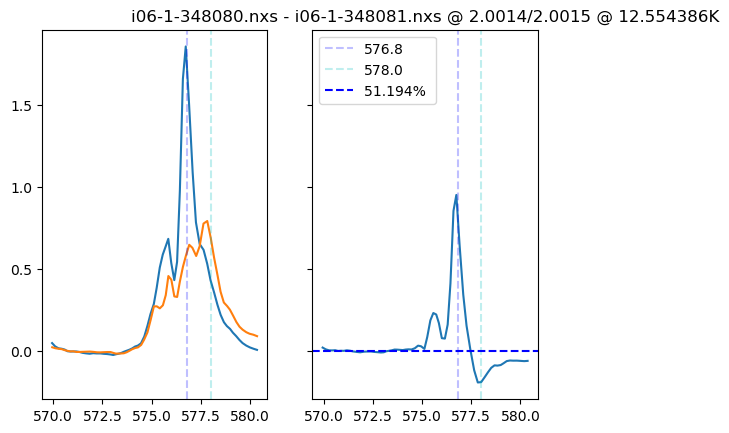

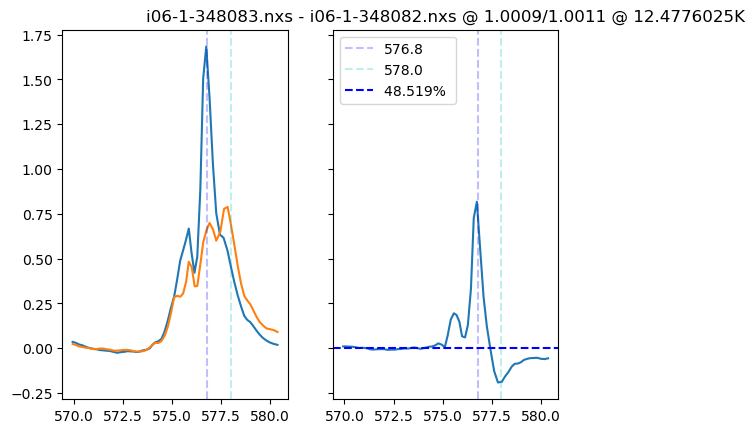

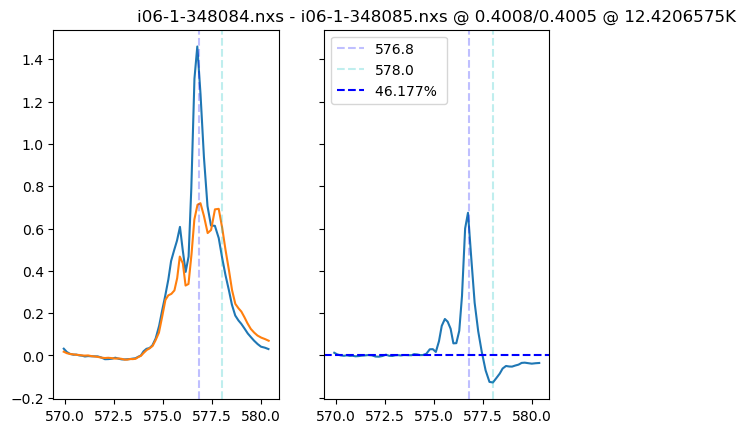

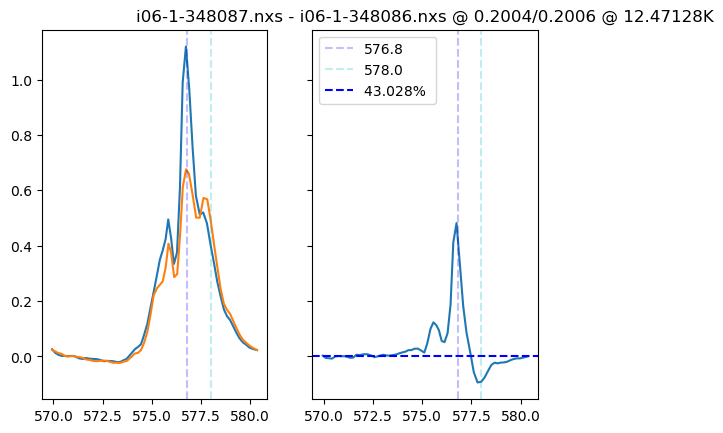

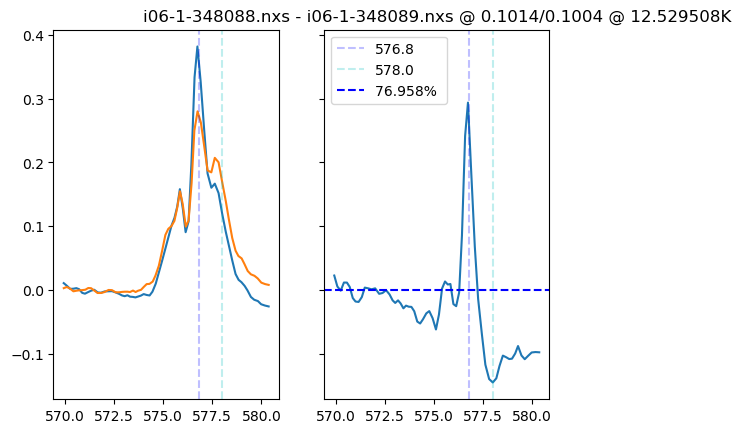

...

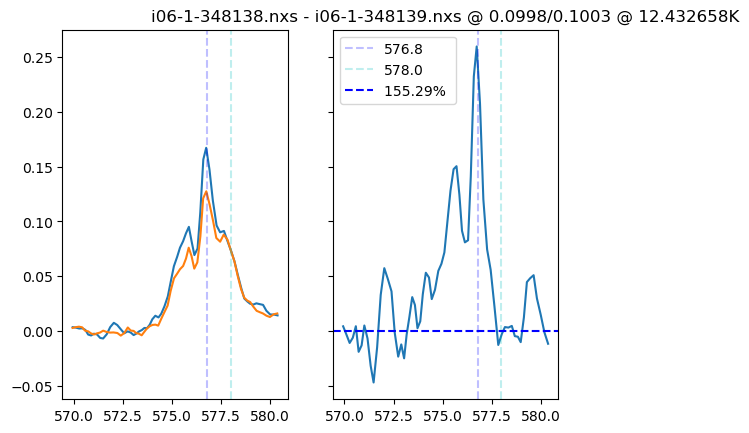

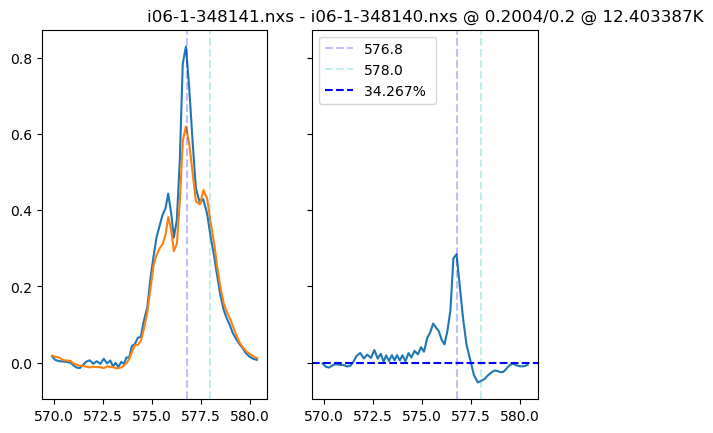

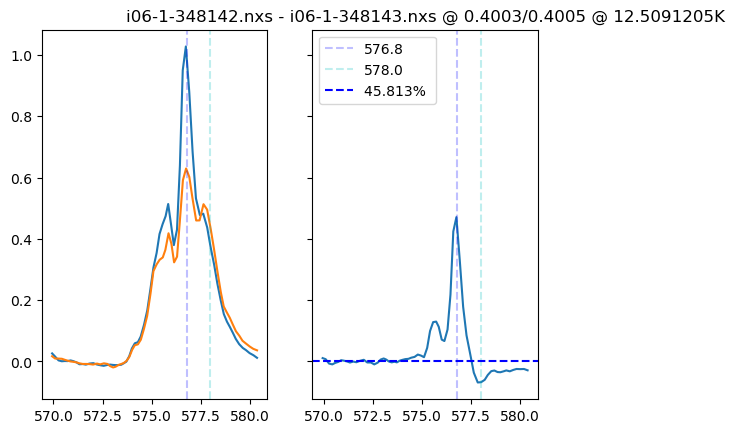

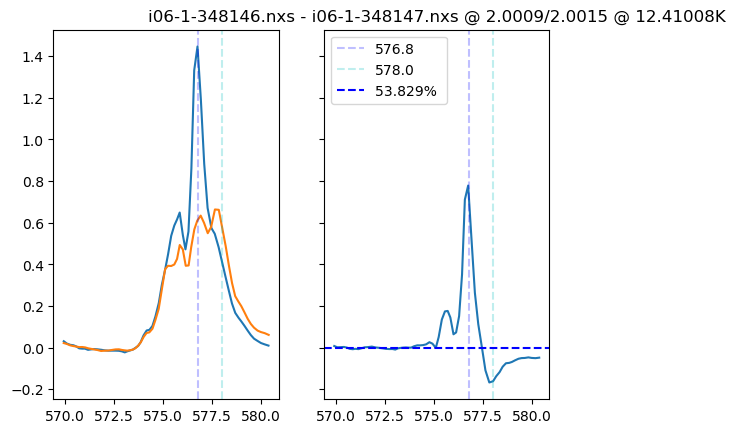

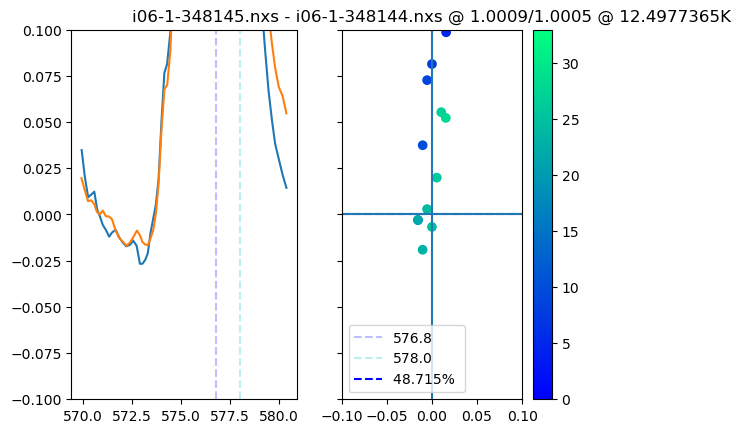

In [186]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_12.5K/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =True,bounds = in_bounds) #in_bounds [[-0.6,0.6],[-0.8,0.8]]

<Figure size 640x480 with 0 Axes>

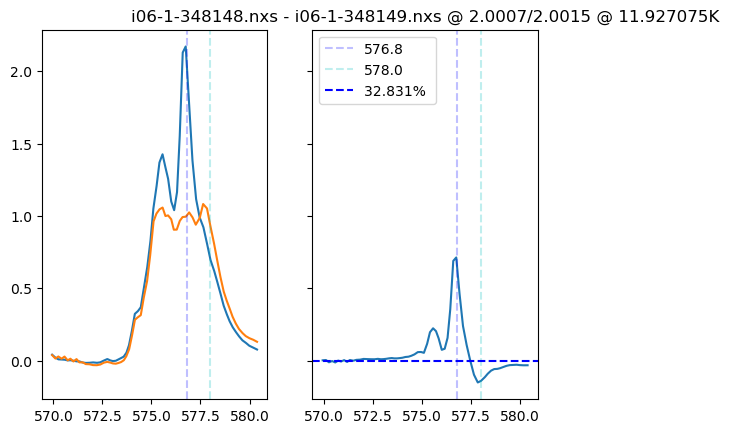

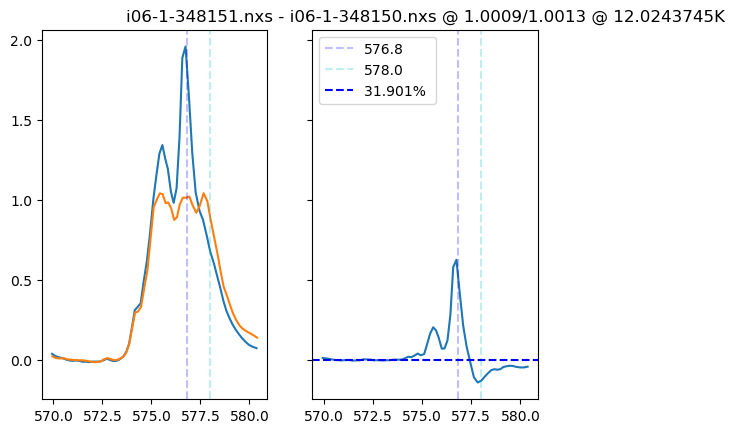

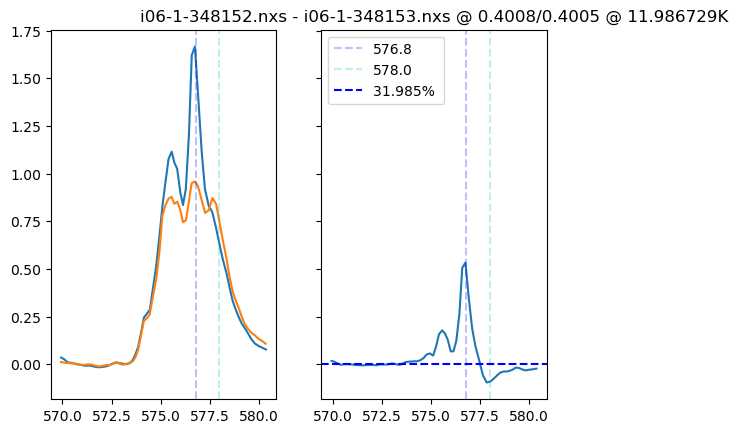

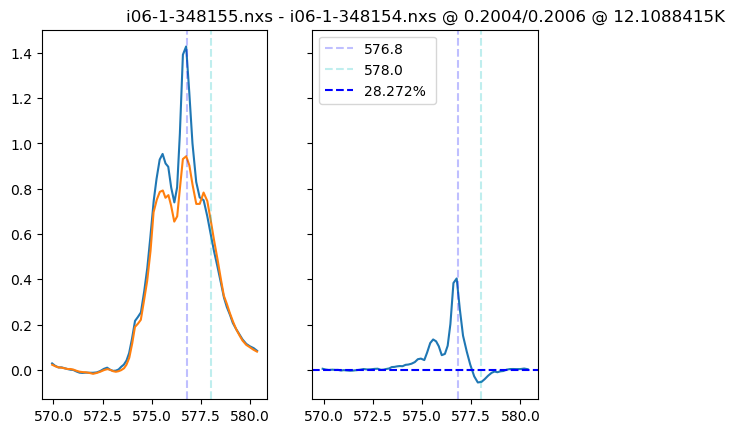

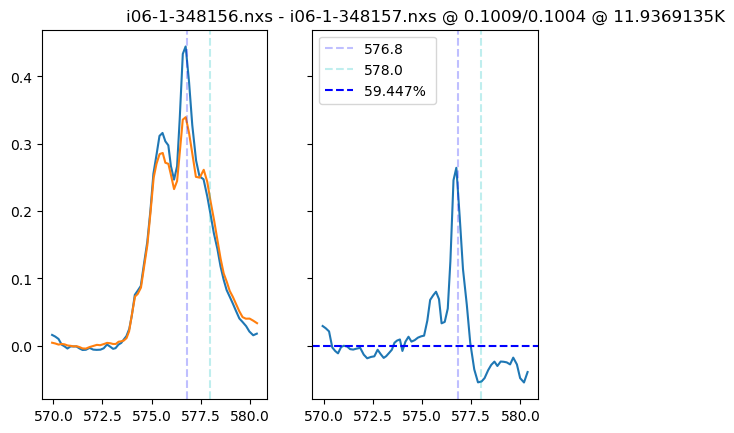

...

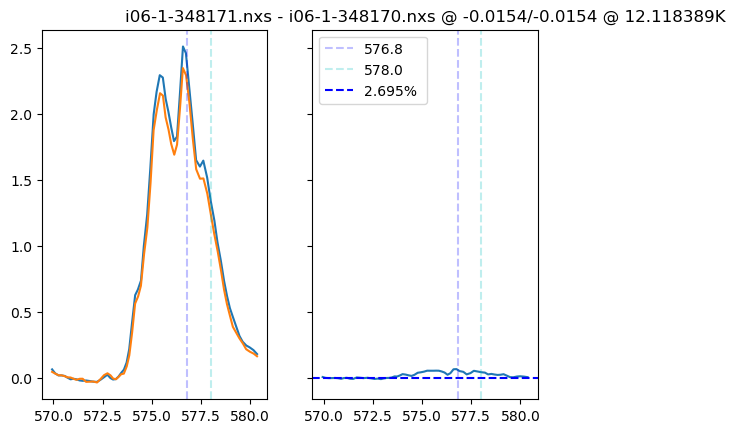

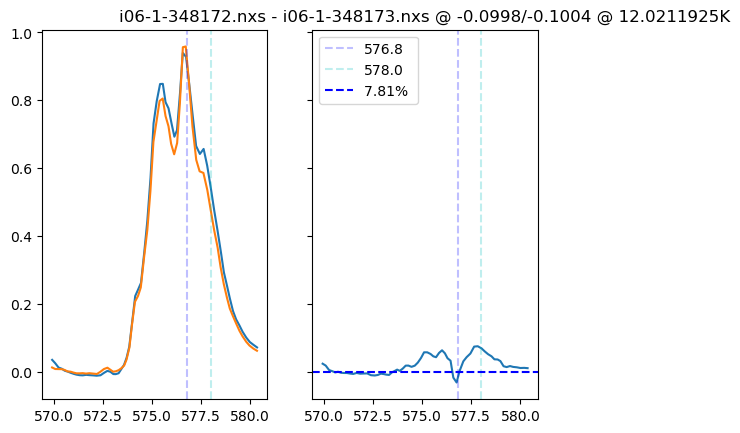

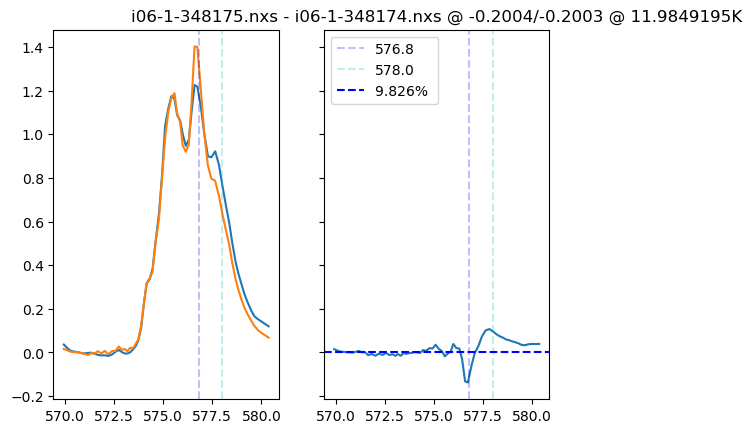

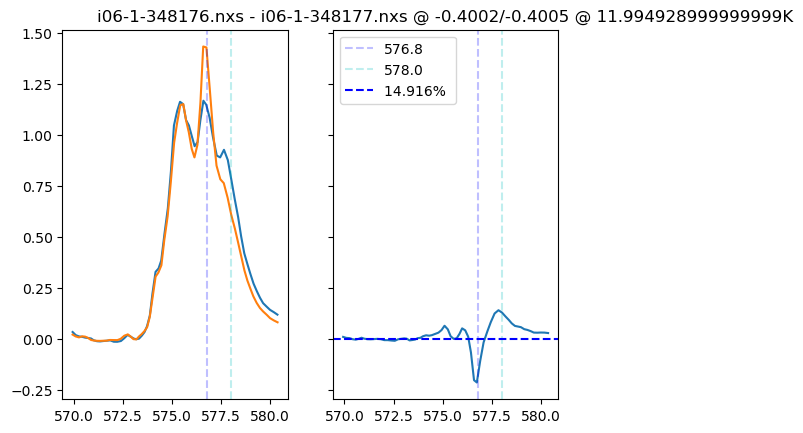

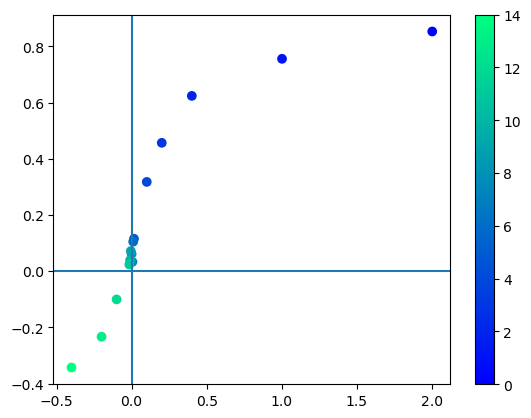

In [201]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_12K/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =True,bounds = None) #in_bounds [[-0.6,0.6],[-0.8,0.8]]

[-2.0015, -1.00105, -0.4006, -0.20135, -0.1006, -0.015600000000000001, -0.01035, -0.00545, -0.0, 0.005350000000000001, 0.01025, 0.0154, 0.1001, 0.20015, 0.40045, 1.0007, 2.00045, 2.0015, 1.00095, 0.4007, 0.20124999999999998, 0.1006, 0.015600000000000001, 0.01035, 0.0054, 0.0, -0.0053, -0.01025, -0.015349999999999999]
8


(np.float64(0.9980137915247036),
 np.float64(-0.019022680042973042),
 np.float64(-0.019060538245580124))

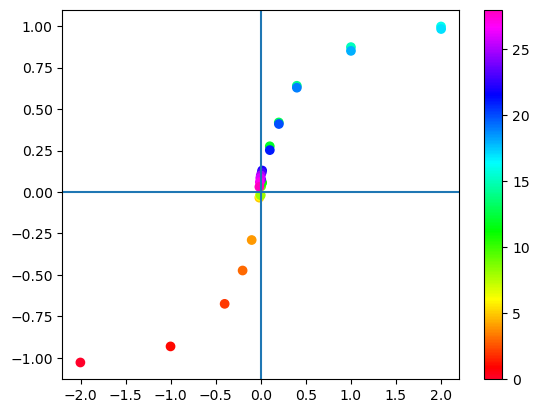

In [281]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_12K_2/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =False,bounds = None) #in_bounds [[-0.6,0.6],[-0.8,0.8]][[-0.03,0.03],[-0.05,0.15]]

# 23:49 - 00:43 BEAM DUMP

[2.00145, 1.00095, 0.4013, 0.2006, 0.1006, 0.0057, 0.0, -0.005350000000000001, -0.0103, -0.0154, -2.0012499999999998, -1.00115, -0.401, -0.20055, -0.10085, -0.0057]
6


(np.float64(0.9991909961261187),
 np.float64(0.09201137281266183),
 np.float64(0.0920858706387383))

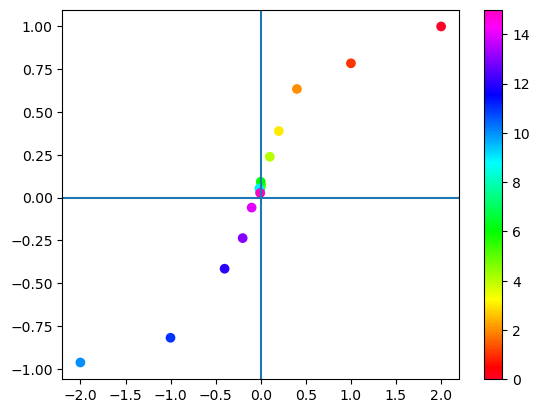

In [285]:
file_path = Path("FILES/HOPG1/Hysteresis_analysis/Manual_Hysteresis_11k/")
manual_hyst(file_path, Yield = "TEY", normalisation=15, Label = False, plot_xmcd =False,bounds = None) #in_bounds [[-0.6,0.6],[-0.8,0.8]][[-0.03,0.03],[-0.05,0.15]]

### 3.40-> 6ish. Now up to 3ish hours Beam dump and helium ran out => Freddie did not appreciate this

347086
347087
B Field -  6.0041
Max Di - 1.4996419263404368, Max Signal - 2.0116636494467226


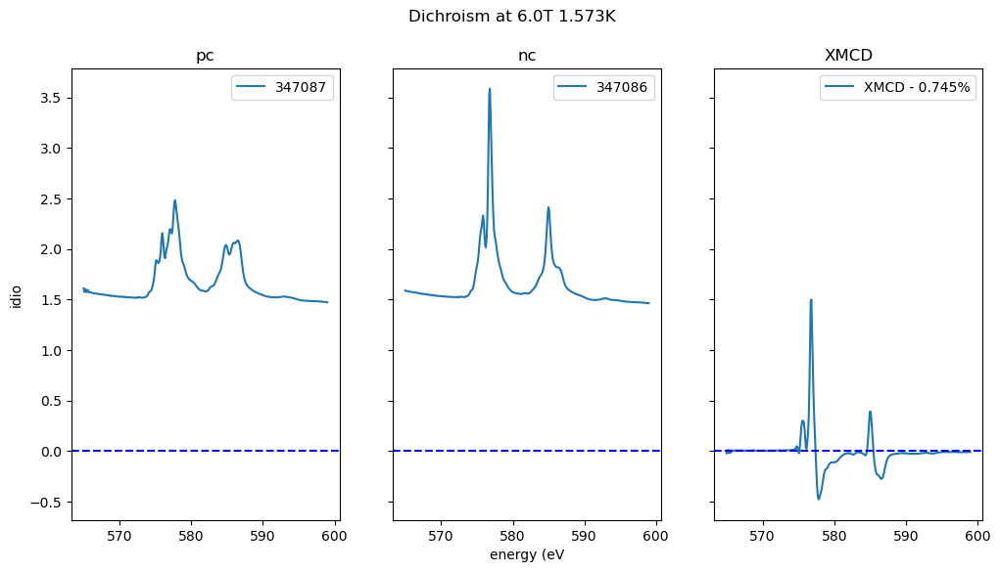

In [289]:
sensor = "TEY"
directory_path = r"FILES/HOPG1/XMCD/"
XMCD_ﬁle_Set = (347086,347087)
XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set)

348304
348305
B Field -  2.0015
Max Di - 4.335689869136101, Max Signal - 5.299327475094932


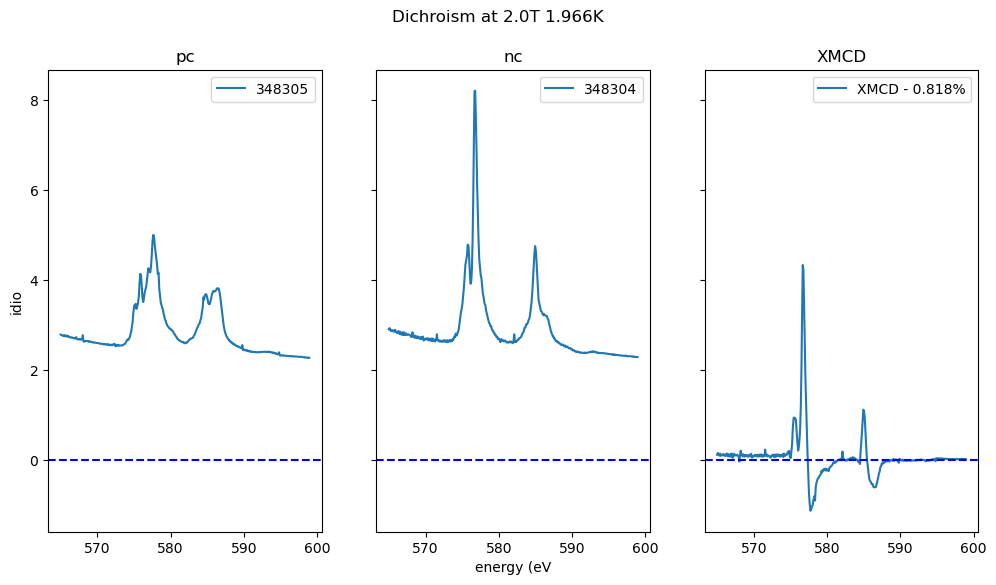

In [288]:
sensor = "TEY"
directory_path = r"FILES/BP1/XMCD/"
XMCD_ﬁle_Set = (348304,348305)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=None) 

348304
348305
B Field -  2.0015
Max Di - 4.335689869136101, Max Signal - 5.299327475094932


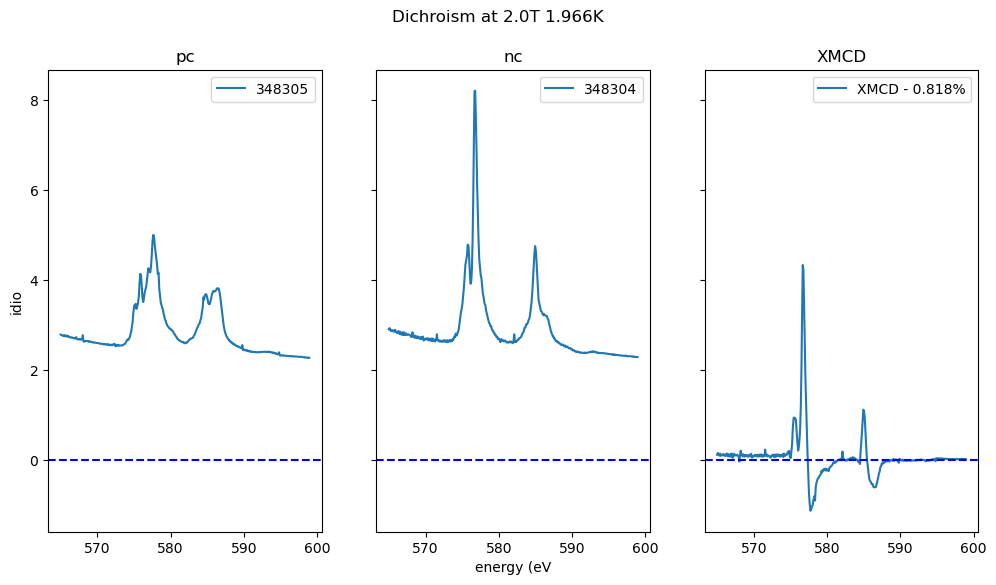

In [288]:
sensor = "TEY"
directory_path = r"FILES/BP1/XMCD/"
XMCD_ﬁle_Set = (348306,348307)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=None) 

348304
348305
B Field -  2.0015
Max Di - 4.335689869136101, Max Signal - 5.299327475094932


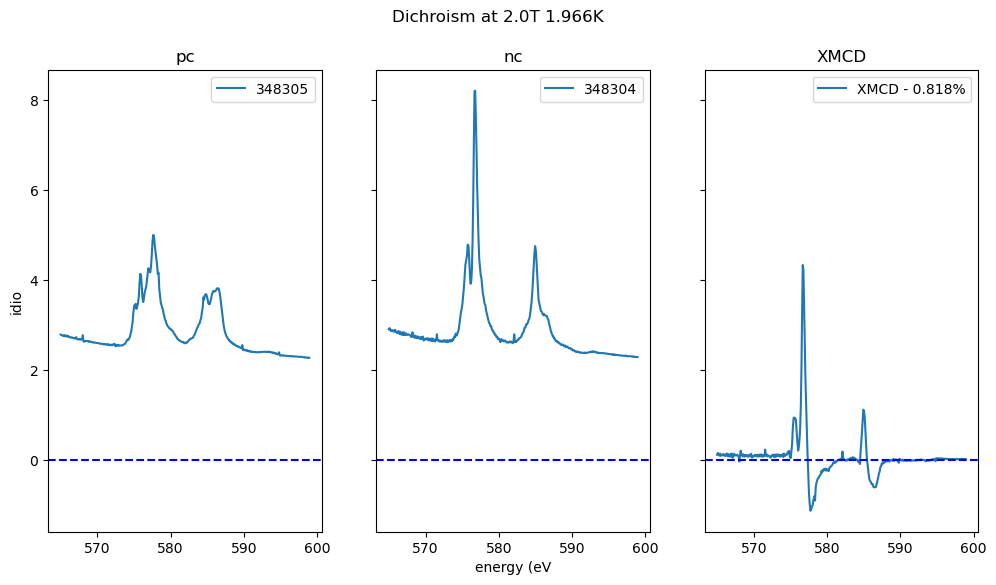

In [288]:
sensor = "TEY"
directory_path = r"FILES/BP1/XMCD/"
XMCD_ﬁle_Set = (348304,348305)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=None) 

348304
348305
B Field -  2.0015
Max Di - 4.335689869136101, Max Signal - 5.299327475094932


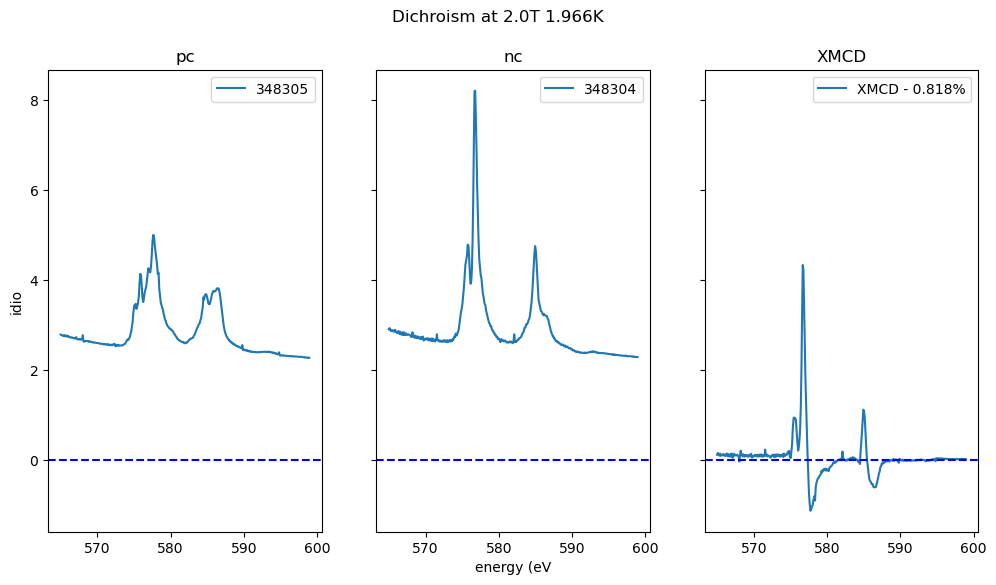

In [288]:
sensor = "TEY"
directory_path = r"FILES/BP1/XMCD/"
XMCD_ﬁle_Set = (348304,348305)

XMCD = prelimenary_code(directory_path, ﬁle_preﬁx, XMCD_ﬁle_Set,sensor)
energy,dichroism = XMCD.Dichroism(XMCD_ﬁle_Set, normalisation=None) 